# <a href="https://mipt-stats.gitlab.io/courses/ad_fivt.html">Введение в анализ данных</a>
## Домашнее задание 2. `Pandas` и `Seaborn`

При возникновении сложностей, связанных с Питоном и библиотеками, посмотрите материалы видео-курса <a href="https://mipt-stats.gitlab.io/courses/python.html">Python для анализа данных</a>. Если не помогло, задайте вопрос по заданию.

**Правила:**

* Выполненную работу нужно отправить телеграм-боту `@miptstats_ad21_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. Работы, присланные иным способом, не принимаются.
* Дедлайн см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно ноутбук в формате ipynb. 
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания все участники списывания будут сдавать устный зачет.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания используйте этот ноутбук в качестве основы, ничего не удаляя из него. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*


**Баллы за задание:**

<b><font color="blue">Легкая часть</font></b> (достаточно на "хор"):
* Задача 1 &mdash; 4 балла
* Задача 2 &mdash; 2 балла

<b><font color="orange">Сложная часть</font></b> (необходимо на "отл"):
* Задача 3 &mdash; 5 баллов
* Задача 4 &mdash; 3 балла
* Задача 5 &mdash; 8 баллов

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='whitegrid', font_scale=1.3, palette='Set2')
%matplotlib inline

### <font color="blue"><i>Легкая часть</i></font>

### Задача 1

Представьте, что вы министр образования страны котиков. Вам нужно решить какие школы лучше: маленькие или большие. Вы решили, что нужно сравнить их по результатам единого кошачьего экзамена (ЕКЭ). Предлагается посмотреть на средний результат по школам: отсортировать по нему и сделать выводы исходя из топ 10 лучших школ.

Вам дан датасет `cat_exam_data.csv` со следующими полями:
* `school` &mdash; номер школы;
* `test_score` &mdash; результат одного ученика из этой школы;
* `number_of_students` &mdash; кол-во учеников в школе.

Приведены данные по всем ученикам из 500 школ страны котиков.

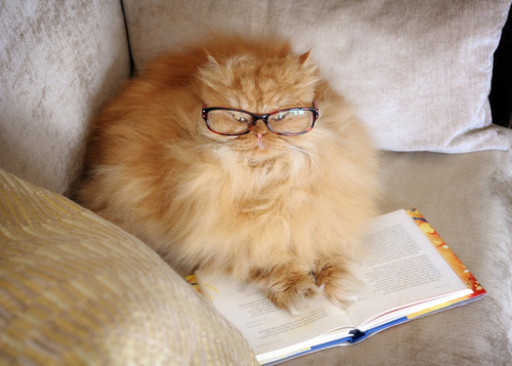

Загрузите датасет с результатами экзамена и посмотрите на первые пять строк.

*Подсказка.* Это можно сделать с помощью методов  <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.read_csv.html">read_csv</a> и <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.head.html">head</a>.

In [16]:
dataset_cat = pd.read_csv('cat_exam_data.csv')
dataset_cat.head(5)

,school,test_score,number_of_students
0,26,39.0,965
1,54,64.0,1483
2,356,64.0,1055
3,108,68.0,1806
4,298,78.0,971


Проверьте, что в данных нет пропусков (`NaN`). Если они есть:
* проверьте в каком столбце;
* удалите их.

*Подсказка.* Могут помочь методы <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.isna.html">isna</a> и <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.dropna.html">dropna</a>.

In [17]:
size_nan = dataset_cat.isna().sum()
size_nan

school                  0
test_score            204
number_of_students      0
dtype: int64

In [18]:
size = dataset_cat.count()
size_nan / size

school                0.000000
test_score            0.000407
number_of_students    0.000000
dtype: float64

То есть имеем меньше 1% пропусков, все в столбце `test_score`. Можем их просто дропнуть.

In [19]:
dataset_cat = dataset_cat.dropna()

size_nan = dataset_cat.isna().sum()

size_nan

school                0
test_score            0
number_of_students    0
dtype: int64

Посчитайте описательные статистики (среднее, мин, макс, и тд.) по колонкам в таблице с помощью одной функции.

In [20]:
dataset_cat.describe()

,school,test_score,number_of_students
count,501358.000000,501358.000000,501358.000000
mean,250.096795,51.681788,1088.910569
std,144.428420,14.179981,281.016801
min,0.000000,-0.000000,156.000000
25%,125.000000,42.000000,890.000000
50%,250.000000,52.000000,1079.000000
75%,377.000000,61.000000,1285.000000
max,499.000000,100.000000,1806.000000


Отдельного внимания заслуживает среднее. Какими способами его можно посчитать? Произведите вычисления и *подробно* проинтерпретируйте результаты. Что стоит публиковать в официальной статистике?

In [21]:
# 1 -- mean
mean = dataset_cat.iloc[:,1].mean()
# 2 -- median
median = dataset_cat.iloc[:,1].median()
# 3 -- mode
mode = dataset_cat.iloc[:,1].mode()

print("Среднее значение -- {},\nмединана - {},\nмода -- {}".format(mean, median, mode))

Среднее значение -- 51.68178826307748,
мединана - 52.0,
мода -- 0    52.0
dtype: float64


Видно, что значение 0 и значение 52 принимаются одинаково часто. Но 0 скорее показывает, сколько котиков не писали этот экзамен. Уверен, они его напишут позже и все будет хорошо)

*Выборочное среднее* или *математическое ожидание* вычисляется как сумма значений случайной величины, умноженных на вероятности, с которыми эти значения принимаются. В самом простом конечном дискретном случае, это просто среднее арифметическое. Оно достаточно здраво характеризует распределение, однако могут получаться значения, которых просто нет, например, если у нас все котики имеют либо меньше $10$ баллов, либо больше $90$, мы получим среднее, равное около $40-50$, хотя котиков, получивших такие результаты, нет.

*Медиана* -- это такое значение случайной величины, что вероятность, что случайная величина больше этого значения или меньше, равны $0.5$. Тоже характеризует распределение, немного с другой стороны.

*Мода* -- значение, которое принимается с наибольшей вероятностью. Оно, как медиана, хотя бы показывает реальное значение случайной величины. Однако мод может быть несколько.

Легко понять, что наблюдаются некотрые отношения между этими средними. Так из курса теории вероятностей известно неравенство $|\mathbb{E} \xi - \mu| \leq \sqrt{\mathbb{D} \xi}$. 

Также легко привести массу примеров, когда *средние* сильно различаются. Например, выборка $0, 2, 3, 100, 100$ -- матожидание равно $41$, медиана $3$, а мода $100$. В другой выборке $1, 2, 3 , 4, 5, 10000, 10000, 10000, 10000$, медиана будет равна $5$, а мода $10000$.

В этом же распределении они близки.

Есть классический пример с зараплатми работников, где матожидание, мода и медиана сильно отличаются, соответсвенно, в официальной статистике стоит публиковать наилучший результат, если это касается, например, средней зарплаты, и наименьшее, если это касается, например, инфляции или смертей.

Посчитайте сколько котиков получили 100 баллов.

In [22]:
best_cats = dataset_cat[dataset_cat['test_score'] == 100]
best_cats.iloc[:,1].count()

51

Выведите подробную информацию о школах, где есть хотя бы один котик, получивший 100 баллов на ЕКЭ.
Отсортируйте эти школы по количеству стобалльников.

*Подсказка.* Могут помочь методы <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.groupby.html">groupby</a>, <a target="_blank" href="https://pandas.pydata.org/pandas-docs/version/0.23.4/generated/pandas.DataFrame.sort_values.html">sort_values</a>, <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.transform.html">transform</a> и <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.count.html">count</a>.

In [23]:
best_schools = dataset_cat[dataset_cat['test_score'] == 100]
best_schools = best_schools.groupby('school').aggregate(np.count_nonzero)
best_schools = best_schools.sort_values(by=['number_of_students'])
best_schools.tail(10)

,test_score,number_of_students
school,,
184,1.0,1
195,1.0,1
206,1.0,1
226,1.0,1
229,1.0,1
232,1.0,1
233,1.0,1
111,1.0,1
498,1.0,1


Посчитайте средний результат каждой из школ и посмотрите на результат. Рассматриваем все школы, не только со стобальниками.

*Подсказка.* Может помочь метод <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.mean.html">mean</a>.

In [24]:
dataset_cat.sort_values('school')
school_mean = dataset_cat.groupby('school').mean()
school_mean

,test_score,number_of_students
school,,
0,52.294258,418
1,52.028950,1209
2,51.751451,1035
3,51.566265,1245
4,51.025641,1015
...,...,...
495,50.933275,1139
496,51.146402,1209
497,51.141228,1140


Отсортируйте школы по среднему результату.

In [25]:
school_mean = school_mean.sort_values(by=['test_score'], ascending=False)

Посмотрите на топ 10 лучших результатов.

In [26]:
school_mean.head(10)

,test_score,number_of_students
school,,
57,53.341682,560
124,52.993311,598
263,52.982063,669
82,52.981982,555
366,52.970207,773
465,52.957555,1179
169,52.932401,858
449,52.910364,357
477,52.898515,808


**Вывод:** Пока что с высоким средним баллом встречаются как большие школы, с числом учеников больше 1000, так и маленькие, где их 300-400. Какой-то четкой закономерности не наблюдается.

Ожидаем, что внизу рейтинга будут только большие школы, давайте это проверим. Посмотрите теперь на 10 худших школ.

In [27]:
school_mean.tail(10)

,test_score,number_of_students
school,,
383,50.716981,636
264,50.702906,929
48,50.690293,649
156,50.641354,1093
394,50.461538,1079
194,50.406977,774
471,50.362500,960
486,50.325000,800
211,50.248571,351


**Вывод:** Однако в конце списка ситуация такая же, есть и большие, и маленькие. Более того, в конце списка средние баллы отличаются всего на 3 целых от лучших, что очень мало. Можно предположить, что нет никакой зависимости между количеством обучающихся и их средним баллом за экзамен.

Постройте график зависимости среднего результата ЕКЭ от количества учеников.

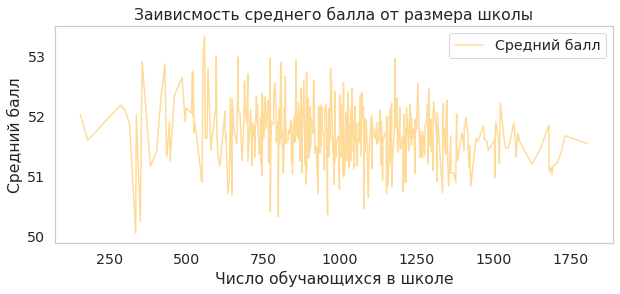

In [28]:
number_of_students = school_mean.sort_values('number_of_students')['number_of_students']
mean_results = school_mean.sort_values('number_of_students')['test_score']

plt.figure(figsize=(10, 4))

plt.title('Заивисмость среднего балла от размера школы')

plt.plot(
    number_of_students, 
    mean_results, 
    alpha=0.4,
    color = 'orange',
    label='Средний балл'
)

plt.xlabel("Число обучающихся в школе")
plt.ylabel("Средний балл")

plt.legend()
plt.grid(ls=':')
plt.show()

**Вывод:** Кажется, что никакой зависимости результатов от числа обучающихся в школе нету. График доказывает наше предположение, все средние баллы колеблются в пределах 52 +- 2, график больше похож на шум. 

Но как же тогда решить какие школы лучше? 

Сгруппируйте учеников в зависимости от типа школы, получив тем самым два датасета. Будем считать, что школа небольшая, если в ней не более 1000 учеников.

In [29]:
subgroups = [(dataset_cat[dataset_cat['number_of_students'] <= 1000]), (dataset_cat[dataset_cat['number_of_students'] > 1000])]
subgroups

[        school  test_score  number_of_students
 0           26        39.0                 965
 4          298        78.0                 971
 7          155        43.0                 969
 8          359        33.0                 895
 9          416        45.0                 522
 ...        ...         ...                 ...
 501549     154        65.0                 597
 501551     162        55.0                 404
 501559     165        80.0                 974
 501560     426        47.0                 899
 501561      76        50.0                 872
 
 [190879 rows x 3 columns],
         school  test_score  number_of_students
 1           54        64.0                1483
 2          356        64.0                1055
 3          108        68.0                1806
 5          386        29.0                1027
 6          317        51.0                1135
 ...        ...         ...                 ...
 501554     129        50.0                1291
 501555   

Постройте гистограммы этих двух выборок на одном графике, установив параметры
* `bins=10` &mdash; число бинов гистограммы;
* `alpha=0.5` &mdash; прозрачность бинов.

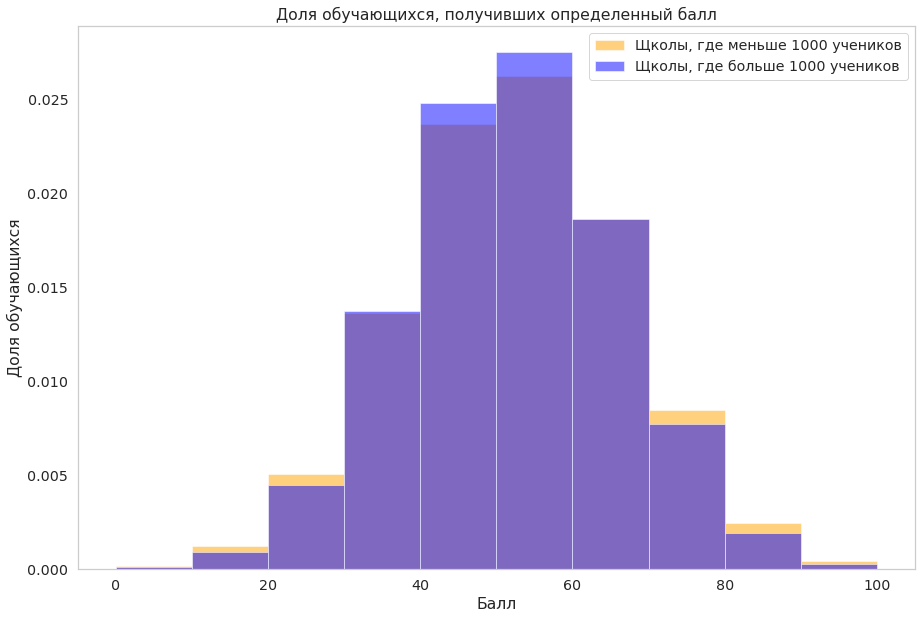

In [30]:
plt.figure(figsize=(15, 10))

plt.title('Доля обучающихся, получивших определенный балл')

plt.hist(
    subgroups[0]['test_score'], 
    bins=10, 
    density=True,
    alpha=0.5, 
    color='orange',
    label = 'Щколы, где меньше 1000 учеников'
)

plt.hist(
    subgroups[1]['test_score'], 
    bins=10, 
    density=True,
    alpha=0.5, 
    color='blue', 
    label = 'Щколы, где больше 1000 учеников'   
)

plt.xlabel("Балл")
plt.ylabel("Доля обучающихся")

plt.legend()
plt.grid(ls=':')
plt.show()

**Вывод:** Только при построении двух диаграм можно увидеть разницу в средних баллах в больших и маленьких школах. По ней хорошо заметно, что в маленьких школах чаще встречаются как результаты выше среднего, так и ниже среднего. А в больших школах больше учеников пишут на средний балл, чем в маленьких. 
С точки зрения министерства котобразования, я бы похвалил большие школы, так как их цель именно в том, чтобы все котики имели хороший средний балл, а нет так, что кто-то знает сильно лучше, а кто-то сильно хуже. 
Однако, тем, кто мотивирован на учебу,следует идти в маленькие школы, где, возможно, практикуется индивидуальный подход, там вероятность получить балл выше среднего будет выше.

---

### Задача 2

Задача заключается в работе с данными о трендах на <a target="_blank" href="https://www.youtube.com/">YouTube</a>. В этом вам поможет библиотека `seaborn`, которая была рассмотрена на одной из последних лекций.

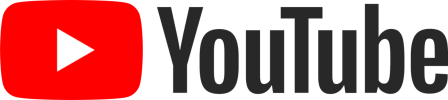


<b>1. Подготовка данных</b>

Скачайте файл `RUvideos_short.csv` с данными о видео в российском сегменте Youtube с 14 ноября по 21 ноября 2017 года. Полная версия данных доступна на <a target="_blank" href="https://www.kaggle.com/datasnaek/youtube-new#RUvideos.csv">kaggle</a>.

Прочитайте данные с помощью библиотеки `pandas` и напечатайте начало таблицы. В колонке `trending_date` записана дата. При чтении таблицы распознайте ее.

*Замечание. Часто считывание дат &mdash; головная боль аналитика.*

In [31]:
from datetime import datetime
custom_date = lambda x : datetime.strptime(x, "%y.%d.%m")
dataset_youtube = pd.read_csv('RUvideos_short.csv', parse_dates=['trending_date'], date_parser=custom_date)
dataset_youtube.head(10)

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
0,gDuslQ9avLc,2017-11-14,Захар и Полина учатся экономить,Т—Ж БОГАЧ,22,2017-11-13T09:09:31.000Z,"захар и полина|""учимся экономить""|""копить день...",62408,334,190,50,https://i.ytimg.com/vi/gDuslQ9avLc/default.jpg,False,False,False,"Знакомьтесь, это Захар и Полина. Вместе с ними..."
1,AOCJIFEA_jE,2017-11-14,Биржа Мемов #29. Большой выпуск,Druzhko Show,22,2017-11-13T17:32:11.000Z,"биржа мемов|""лев шагинян""|""мемы""|""пикчи""|""друж...",330043,43841,2244,2977,https://i.ytimg.com/vi/AOCJIFEA_jE/default.jpg,False,False,False,"В 29 выпуске Дружко Шоу Сергей сказал, что Бир..."
2,VAWNQDgwwOM,2017-11-14,ХАЙП КЭМП - СВОЙ СРЕДИ ЧУЖИХ,Юлик,24,2017-11-13T16:11:31.000Z,"юмор|""комедия""|""влог""|""блог""|""смешно""|""смешное...",424596,49854,714,2944,https://i.ytimg.com/vi/VAWNQDgwwOM/default.jpg,False,False,False,http://kapitany.ru/!Yulik.cap - Факультет #Кап...
3,gknkFwKQfHg,2017-11-14,Сочная кесадилья с курицей,Hochland,22,2017-11-13T06:51:10.000Z,"хохланд|""сыр""|""рецепты""|""как приготовить""|""вку...",112851,3566,122,80,https://i.ytimg.com/vi/gknkFwKQfHg/default.jpg,False,False,False,*** как готовить ресторанные блюда дома
4,3sYvZcwzZr8,2017-11-14,КЛИПЫ РОДИТЕЛЕЙ НА ШКОЛЬНЫЙ ВЫПУСКНОЙ,Совергон,24,2017-11-13T16:52:36.000Z,"Совергон|""Sovergon""|""клипы""|""родители""|""школа""...",243469,36216,631,1692,https://i.ytimg.com/vi/3sYvZcwzZr8/default.jpg,False,False,False,❏ КОНКУРС КАПИТАНЫ: http://kapitany.ru/!Soverg...
5,SLF34Gt_UxQ,2017-11-14,АНОНС / Versus Fresh Blood 4: Война Стилей,versusbattleru,24,2017-11-12T17:50:31.000Z,[none],733936,47964,2545,3901,https://i.ytimg.com/vi/SLF34Gt_UxQ/default.jpg,False,False,False,Участвовать в проекте допускаются только лица ...
6,YVcroDDi24s,2017-11-14,ЗАМОРОЗКА ЧЕЛОВЕКА + 1 К БЕССМЕРТИЮ — ТОПЛЕС,ТОПЛЕС,28,2017-11-12T17:19:59.000Z,"топлес|""ян топлес""|""ян лапотков""|""caramba""|""to...",1131851,78692,2427,4114,https://i.ytimg.com/vi/YVcroDDi24s/default.jpg,False,False,False,"Факультет Капитаны России, мой курс ► http://k..."
7,TZdNwUSgRHc,2017-11-14,"РПЦ незаконно строит храм, полиция смотрит как...",Нет застройке без согласия,22,2017-11-13T06:29:09.000Z,[none],97006,2259,330,887,https://i.ytimg.com/vi/TZdNwUSgRHc/default.jpg,False,False,False,"Строители нападают на муниципального депутата,..."
8,YxEJVGfP74Y,2017-11-14,Итальянцы VS русская народная медицина,Итальянцы by Kuzno Productions,24,2017-11-13T17:22:55.000Z,"Итальянцы|""эмоциональные итальянцы""|""итальянцы...",105116,9780,93,1184,https://i.ytimg.com/vi/YxEJVGfP74Y/default.jpg,False,False,False,Внимание! Стрим с Алессандрой пройдет 23 ноябр...
9,oZYT_vC4-pc,2017-11-14,КВН 2017 Высшая лига Вторая 1/2 (12.11.2017) И...,Официальный канал КВН,23,2017-11-12T22:00:03.000Z,"KVN|""КВН""|""камеди""|""comedy""|""приколы""|""финал""|...",442228,3194,5985,3218,https://i.ytimg.com/vi/oZYT_vC4-pc/default.jpg,False,False,False,КВН 2017 Высшая лига Вторая 1/2 (12.11.2017) И...


In [32]:
dataset_youtube.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1600 entries, 0 to 1599
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   video_id                1600 non-null   object        
 1   trending_date           1600 non-null   datetime64[ns]
 2   title                   1600 non-null   object        
 3   channel_title           1600 non-null   object        
 4   category_id             1600 non-null   int64         
 5   publish_time            1600 non-null   object        
 6   tags                    1600 non-null   object        
 7   views                   1600 non-null   int64         
 8   likes                   1600 non-null   int64         
 9   dislikes                1600 non-null   int64         
 10  comment_count           1600 non-null   int64         
 11  thumbnail_link          1600 non-null   object        
 12  comments_disabled       1600 non-null   bool    

В таблице много лишних данных. Оставьте следующие столбцы:
* `trending_date` &mdash; дата в формате год-день-месяц;
* `category_id` &mdash; категория видео, названия приведены в файле `RU_category_id.json`;
* `views` &mdash; количество просмотров видео;
* `likes` &mdash; количество лайков;
* `dislikes` &mdash; количество дислайков;
* `comment_count` &mdash; количество комментариев.

Из даты оставьте только день. Для этого можно пройтись циклом по всем датам и взять поле `day` у объекта даты. Напечатайте начало таблицы.

In [33]:
dataset_youtube = dataset_youtube[['trending_date', 'category_id', 'views', 'likes', 'dislikes', 'comment_count']]
dataset_youtube.trending_date = dataset_youtube.trending_date.dt.day
dataset_youtube


,trending_date,category_id,views,likes,dislikes,comment_count
0,14,22,62408,334,190,50
1,14,22,330043,43841,2244,2977
2,14,24,424596,49854,714,2944
3,14,22,112851,3566,122,80
4,14,24,243469,36216,631,1692
...,...,...,...,...,...,...
1595,21,2,5498,373,19,49
1596,21,2,40394,1339,179,201
1597,21,25,3516,65,7,4
1598,21,25,47507,4372,231,2380


<b>2. Некоторая визуализация</b>

Постройте ящики с усами на каждый день по количеству просмотров. Насколько хороший получился график?

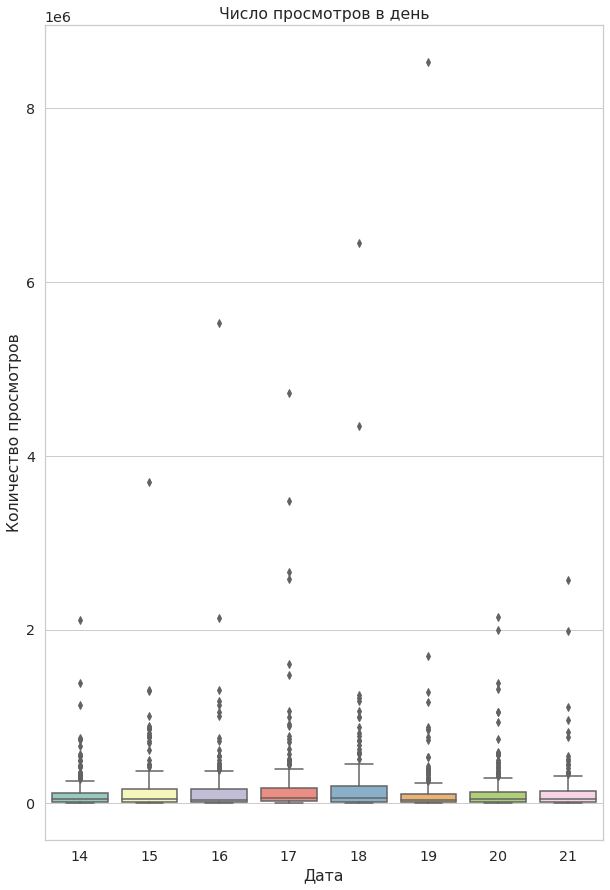

In [34]:
plt.figure(figsize=(10,15))

sns.boxplot(data=dataset_youtube, x='trending_date', y='views', palette='Set3')

plt.title('Число просмотров в день')
plt.xlabel('Дата')
plt.ylabel('Количество просмотров')
plt.show()

Много выбросов, уберем их.

Исправьте этот недостаток, установив некоторое значение. 

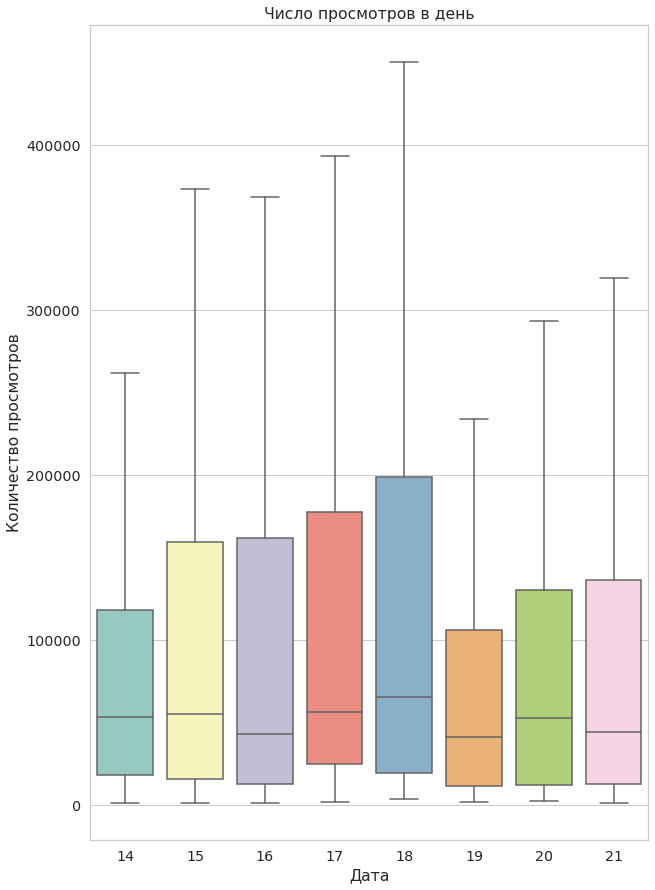

In [35]:
plt.figure(figsize=(10,15))

sns.boxplot(data=dataset_youtube, x='trending_date', y='views', showfliers = False, palette='Set3')

plt.title('Число просмотров в день')
plt.xlabel('Дата')
plt.ylabel('Количество просмотров')
plt.show()

**Вывод:** Медиана у распределений по дням примерно совпадает. Однако верхний квартиль выделяется у $18$ числа, если посмотреть на календарь, легко увидеть, что это как раз суббота. То есть вероятность того, что наша случайная величина попадает от среднего до верхнего квартилей, она больше, чем в предыдущие дни. Да и сама медиана выше.
Потом наблюдается спад и периодичность картинки по неделям.

Постройте `jointplot` по всем данным для количества просмотров по горизонтальной оси и количества лайков по вертикальной. Насколько информативен такой график?

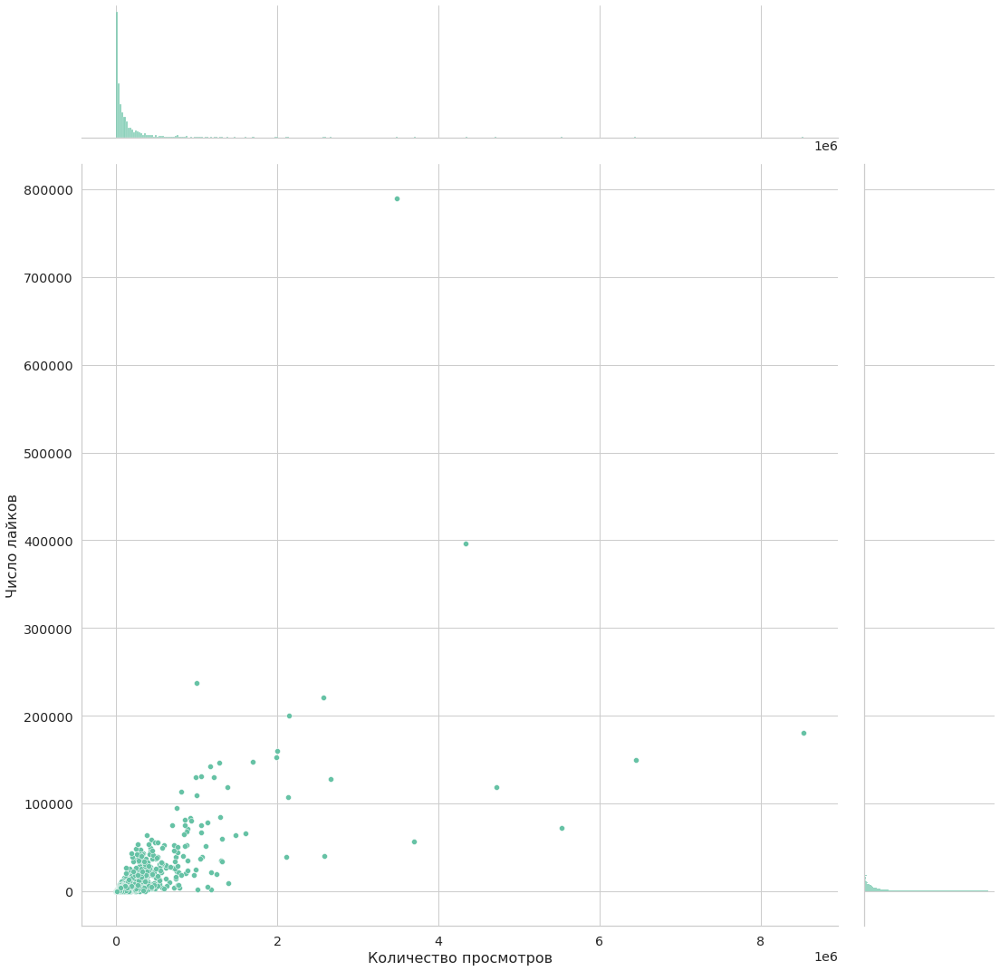

In [36]:
h = sns.jointplot(data=dataset_youtube, x="views", y="likes", height=15)
h.set_axis_labels('Количество просмотров', 'Число лайков', fontsize=16)
plt.show()

Слишком много выбросов, основная информация сосредосточна в левом нижнем углу, обрежем данные.

Исправьте этот недостаток.

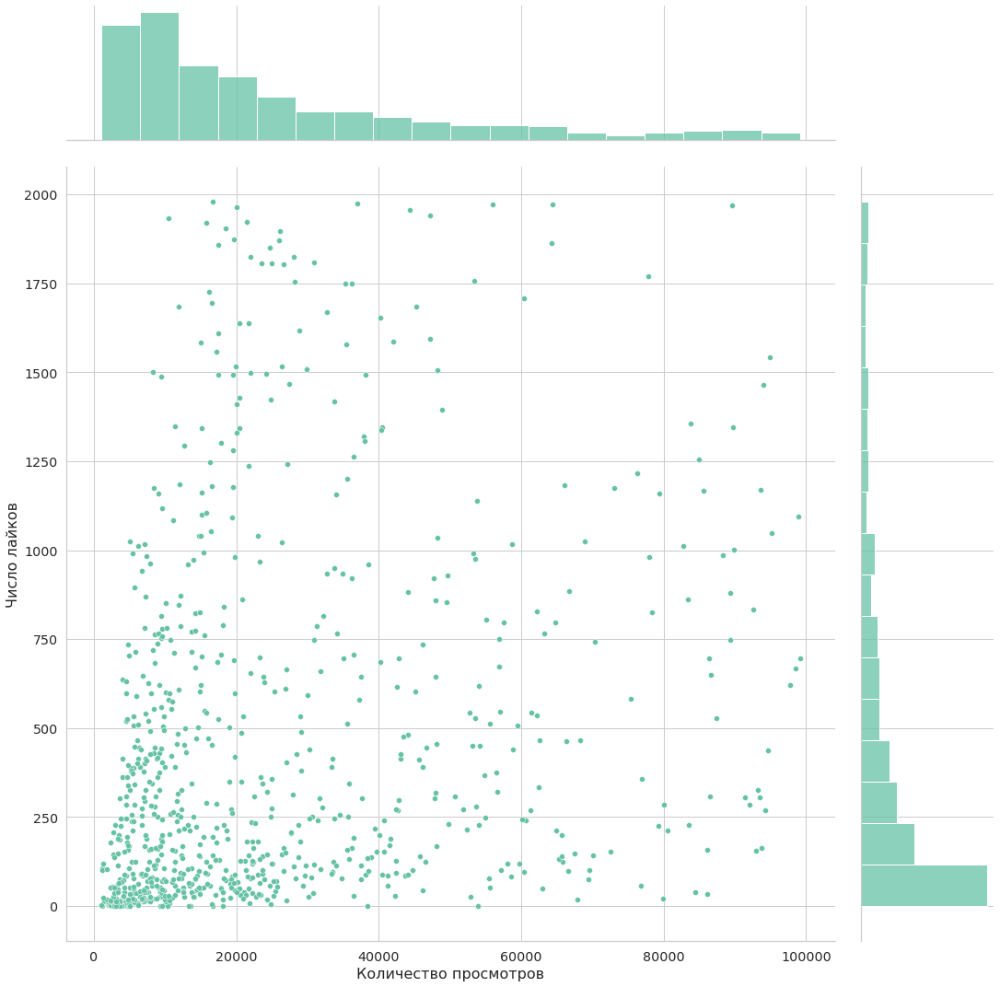

In [37]:
cut_views = dataset_youtube[dataset_youtube['views'] < 100000]
cut_likes = cut_views[cut_views['likes'] < 2000]

h = sns.jointplot(data=dataset_youtube, x=cut_likes['views'], y=cut_likes['likes'], height=15)
h.set_axis_labels('Количество просмотров', 'Число лайков', fontsize=16)
plt.show()

**Вывод:** Наблюдается некоторая верхняя граница для числа лайков от количества просмотров. Это и понятно, люди не ставят лайки, не посмотрев видео. Она имеет зависимость, отдаленно напоминающую корень. Также стоит отметить, что очень много выбросов, есть видео с огромным количеством просмотров, но очень маленьким числом лайков. Скорее всего это связано с качество видео, интересно посмотреть на число дизлайков у таких видео.


---
### <font color="orange"><i>Сложная часть</i></font>

### Задача 3

<a target="_blank" href="https://www.netflix.com">Netflix</a> за последние 5-10 лет обзавелись большим количеством зрителей. С увеличением числа зрителей увеличилось и разнообразие шоу. Соответственно, перед аналитиками из киноиндустрии встала задача исследования данных с рейтингами различных сериалов.  
В данном задании вам предстоит провести визуальный анализ датасета **1000 Netflix Shows** (по состоянию на 11.06.2017) и сделать выводы.  


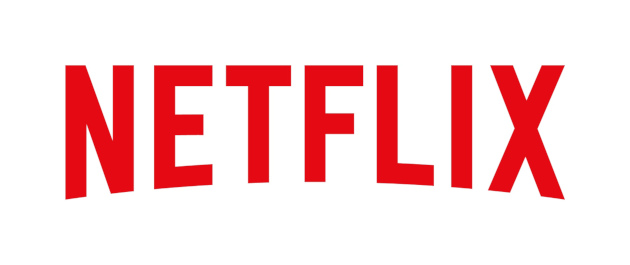

Описание признаков:
* `title` &mdash; название шоу;
* `rating` &mdash; рейтинг шоу. Например: G, PG, TV-14, TV-MA;
* `ratingLevel` &mdash; описание рейтинговой группы и особенностей шоу;
* `release year` &mdash; год выпуска шоу;
* `user rating score` &mdash; оценка пользователей.


Загрузите данные, выполнив код ниже.

In [5]:
data = pd.read_csv('netflix_data.csv', encoding='cp437')

del data['ratingDescription'], data['user rating size']

In [6]:
data.head()

,title,rating,ratingLevel,release year,user rating score
0,White Chicks,PG-13,"crude and sexual humor, language and some drug...",2004,82.0
1,Lucky Number Slevin,R,"strong violence, sexual content and adult lang...",2006,NaN
2,Grey's Anatomy,TV-14,Parents strongly cautioned. May be unsuitable ...,2016,98.0
3,Prison Break,TV-14,Parents strongly cautioned. May be unsuitable ...,2008,98.0
4,How I Met Your Mother,TV-PG,Parental guidance suggested. May not be suitab...,2014,94.0


Удалите из данных дупликаты. Сколько объектов удалено?

In [7]:
old_size = len(data)
data = data.drop_duplicates()
new_size = len(data)
old_size - new_size

500

Сколько объектов осталось?

In [8]:
new_size

500

Есть ли в данных пропуски?

Если да, то при дальнейшем анализе подумайте, как их корректнее обработать. Учтите, что многие методы умеют работать с пропусками.

In [9]:
data.isna().sum()

title                  0
rating                 0
ratingLevel           33
release year           0
user rating score    244
dtype: int64

Удалили половину датасета, так еще и в оставшихся в графе 'user rating score' половина пропусков, учтем.

Сколько рейтинговых групп представлено в данных?

In [10]:
data['rating'].nunique()

13

Какие оценки пользователи ставят чаще? Постройте гистограмму оценок.

In [11]:
len(data['user rating score'].dropna())
data['user rating score'].dropna().head(10)

0     82.0
2     98.0
3     98.0
4     94.0
5     95.0
6     97.0
7     91.0
8     98.0
9     96.0
10    98.0
Name: user rating score, dtype: float64

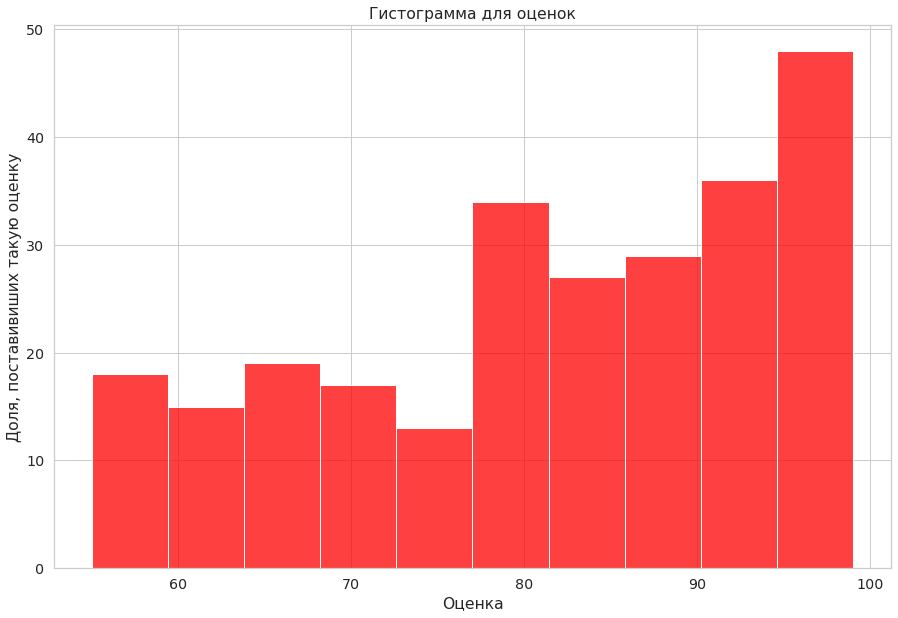

In [12]:
plt.figure(figsize=(15, 10))

sns.histplot(
    data['user rating score'].dropna(), 
    bins = 10,
    color='red'
)
plt.title('Гистограмма для оценок')
plt.xlabel('Оценка')
plt.ylabel('Доля, поставивиших такую оценку')


plt.show()

**Вывод:** Большая часть пользователей если и ставит оценку сериалу или фильму, то высокую, от $90$ до $100$, это даже можно объяснить с психологической точки зрения, когда тебе что-то не нравится, ты не хочешь больше тратить на это свое время. Также выделяется оценка $80$ - что означает "хорошо", но не "отлично". С другой стороны, датасет совсем не большой и возможно там просто попались хорошие сериалы, никто ниже $55$ не поставил.

Выведите основную информацию об оценках пользователей: среднее, стандартное отклонение, минимум, максимум, медиана. Отличаются ли медиана и среднее? Могут ли данные характеристики значительно отличаться? Почему?

In [13]:
data['user rating score'].dropna().describe()

count    256.000000
mean      81.398438
std       12.730904
min       55.000000
25%       71.000000
50%       83.500000
75%       93.000000
max       99.000000
Name: user rating score, dtype: float64

**Ответ:** В данном датасете медиана и среднеее почти не отличаются, они равны, соответственно, $83.5$ и $81.4$. В первом пункте я привел пример, где медиана и среднее сильно отличаются: выборка -- $0, 2, 3, 100, 100$ -- матожидание равно $41$, медиана $3$, а мода $100$.

В какие годы были запущены шоу, представленные в датасете?

In [14]:
years_release = data.sort_values('release year')[['release year']].dropna()
years_release['release year'].drop_duplicates()

761    1940
506    1976
252    1978
772    1982
762    1986
908    1987
973    1989
749    1990
771    1991
805    1992
500    1993
600    1994
967    1995
520    1996
703    1997
755    1998
553    1999
757    2000
910    2001
767    2002
253    2003
659    2004
275    2005
255    2006
503    2007
829    2008
258    2009
352    2010
273    2011
55     2012
985    2013
830    2014
561    2015
111    2016
146    2017
Name: release year, dtype: int64

Постройте график, показывающий распределение количества запущенных шоу в зависимости от года. Наблюдается ли рост? Есть ли выбросы?

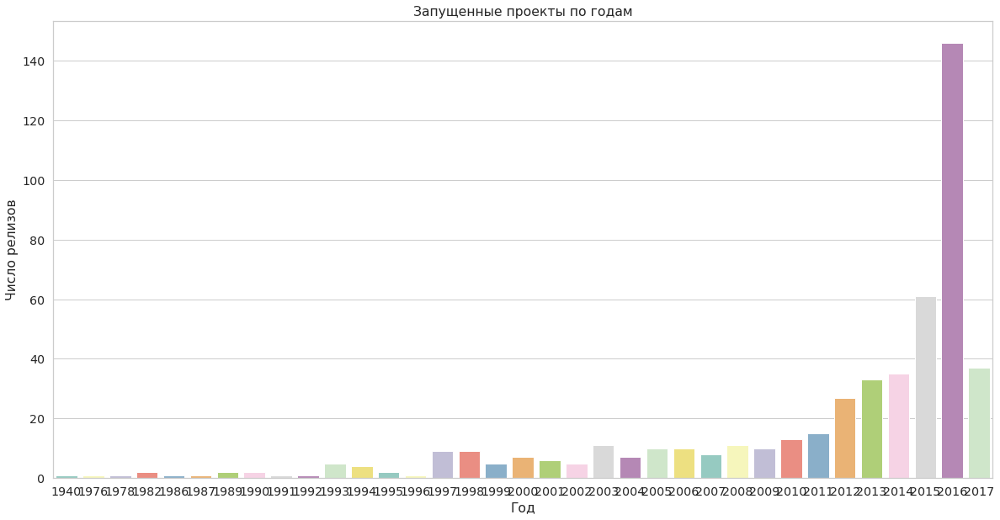

In [15]:
plt.figure(figsize=(20, 10))

sns.countplot(x=years_release['release year'], palette='Set3')

plt.title('Запущенные проекты по годам')
plt.xlabel('Год')
plt.ylabel('Число релизов')

plt.show()

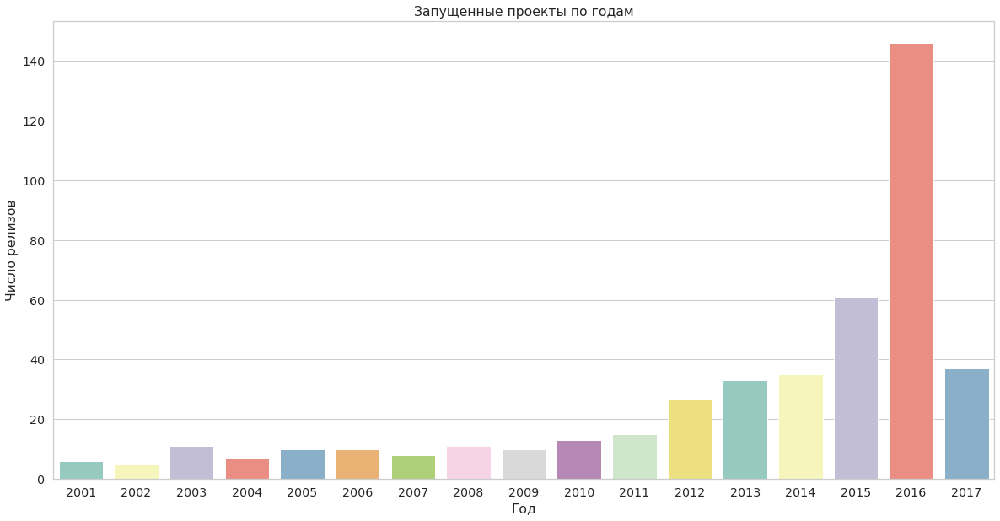

In [16]:
# посмотрим, что по последним 20 годам
plt.figure(figsize=(20, 10))

sns.countplot(x=years_release[years_release['release year'] > 2000]['release year'], palette='Set3')


plt.title('Запущенные проекты по годам')
plt.xlabel('Год')
plt.ylabel('Число релизов')

plt.show()

**Вывод:** Да, как и следовало ожидать, наблюдается рост количества выпускаемых шоу каждый год. Есть выброс или резкий росто -- это переход между $2015$ и $2016$ годами, не очень понятно, что тогда произошло, возможно, netflix тогда выпустил несколько хороших среиалов, люди про него узнали, сработал эффект сарафанного радио. К слову, я сам узнал про него примерно в это время. Также нужно вспомнить о том, что у нас есть информация только по первой половине $2017$ года, вероятнее всего, впереди еще много проектов. В любом случае число за $2017$ год не должно быть сильно меньше $2015$ или $2016$. По годам до $1970$ информации совсем мало, но это и понятно, тогда было очень мало.

Сравните среднюю оценку пользователей в 2016 со средней оценкой в 2017. Можно ли сделать вывод, что 2017 год успешнее для Netflix? "Успешнее" означает, что пользователи в среднем ставили более высокие оценки.
Ответить на этот вопрос вам поможет график, который вы построили выше.

In [17]:
rating_2016 = data[data['release year'] == 2016]['user rating score'].dropna()
rating_2017 = data[data['release year'] == 2017]['user rating score'].dropna()

print("Средняя оценка за 2016 год -- {}, за 2017 -- {}".format(rating_2016.mean(), rating_2017.mean()))

Средняя оценка за 2016 год -- 84.31395348837209, за 2017 -- 88.125


**Вывод:** Средний рейтинг за $2017$ год явно выше, однако судя по графику выше, мы имеем неполные данные, поэтому сказать однозначно нельзя. Скорее всего для netflix гораздо важнее количество успешных проектов, а не средний рейтинг по всем шоу, тогда $2016$ год точно успешен. И опять же стоит учитывать, что впереди еще большая половина $2017$ года. 

Ниже представлены два графика, показывающие распределение шоу по рейтинговым группам. Какой тип графика визуально более интерпретируемый? [Подсказка](https://mipt-stats.gitlab.io/courses/ad_fivt/Jobs.jpg)

Постройтре самостоятельно график, который считаете более интерпретируемым. Сделайте вывод.

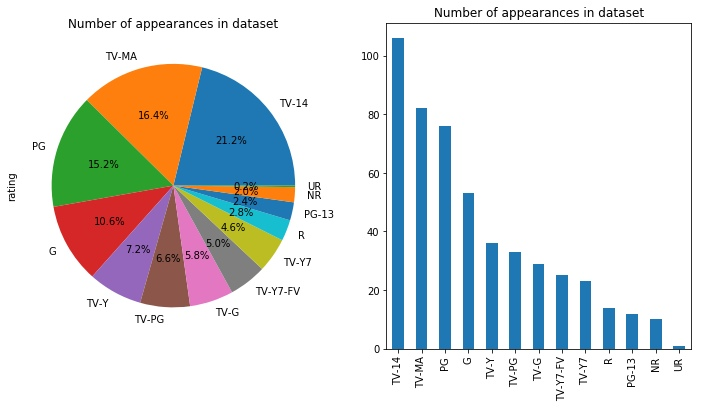

In [51]:
groups = data.groupby('rating').count()
groups

,title,ratingLevel,release year,user rating score
rating,,,,
G,53,52,53,19
NR,10,7,10,2
PG,76,76,76,48
PG-13,12,12,12,9
R,14,14,14,7
TV-14,106,101,106,77
TV-G,29,29,29,11
TV-MA,82,60,82,40
TV-PG,33,31,33,21


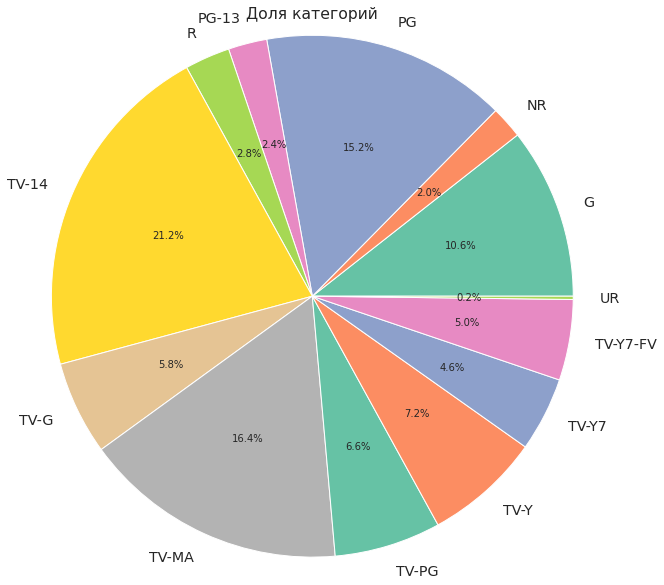

In [52]:
plt.figure(figsize=(10, 10))

plt.pie(
    groups['title'],
    radius=1.2,
    autopct='%.1f%%', 
    labels=groups.index
)
plt.title('Доля категорий')
plt.show()

**Вывод:** По такому графику отлично видно, что значительные части всех шоу занимают возрастные категории TV-14(старше 14 лет), TV-MA(старше 17), PG(рекомендуется родительский контроль). В сумме эти возрастные категории занимают большую половину. Есть совсем непопулярные категории, так как UR, R, PG-13, NR.

Составьте топ-13 самых высоко оцененных шоу. Выберите из данного топа шоу, которое вам наиболее нравится. Обозначим это шоу N.
Ответьте на следующие вопросы.
* Какое шоу является худшим по оценкам в рейтинговой группе, к которой принадлежит N?  
* Сколько шоу было выпущено в одном году с N?  
* Насколько бы изменилась средняя оценка шоу, выпущенных в одном году с N, если бы Netflix не запустили шоу N?

In [53]:
data.dropna().sort_values(by='user rating score', ascending = False).head(13)

,title,rating,ratingLevel,release year,user rating score
41,13 Reasons Why,TV-MA,For mature audiences. May not be suitable for...,2017,99.0
63,Criminal Minds,TV-14,Parents strongly cautioned. May be unsuitable ...,2016,98.0
3,Prison Break,TV-14,Parents strongly cautioned. May be unsuitable ...,2008,98.0
64,Friends,TV-14,Parents strongly cautioned. May be unsuitable ...,2003,98.0
2,Grey's Anatomy,TV-14,Parents strongly cautioned. May be unsuitable ...,2016,98.0
8,The Walking Dead,TV-MA,For mature audiences. May not be suitable for...,2015,98.0
10,Once Upon a Time,TV-PG,Parental guidance suggested. May not be suitab...,2016,98.0
27,The Flash,TV-PG,Parental guidance suggested. May not be suitab...,2016,98.0
350,Lost,TV-14,Parents strongly cautioned. May be unsuitable ...,2010,98.0
88,Finding Dory,PG,mild thematic elements,2016,98.0


Пожалуй, я выберу классику, сериал "Друзья" остается актуальным по сей день.

In [54]:
friends = data[data['title'] == 'Friends']
friends

,title,rating,ratingLevel,release year,user rating score
64,Friends,TV-14,Parents strongly cautioned. May be unsuitable ...,2003,98.0


In [55]:
rating = friends.rating
same_group = data[data['rating'] == rating.values[0]]
same_group.sort_values('user rating score', ascending = True).head(2)

,title,rating,ratingLevel,release year,user rating score
179,Haters Back Off,TV-14,Parents strongly cautioned. May be unsuitable ...,2016,58.0
212,Being Human (U.S.),TV-14,Parents strongly cautioned. May be unsuitable ...,2014,58.0


Выше можно увидеть худшие шоу в категории с сериалом "Друзья".

Посчитаем, сколько было выпущено в тот же год.

In [56]:
year = friends['release year']
same_year = data[data['release year'] == year.values[0]]
same_year['title'].count()

11

На сколько бы изменился балл? 

In [57]:
old_mean = same_year['user rating score'].mean()
new_mean = same_year['user rating score'].drop(index=friends.index).mean()
old_mean - new_mean

6.349999999999994

Кажется, это очень большой балл, для одного шоу. Но этого и следовало ожидать от такого успешного проекта.

Ответьте на следующие вопросы, проанализировав `boxplot`-график.
* Какую рейтинговую группу зрители оценивали выше всего в последние пять лет, за которые есть данные? 
* Как менялись оценки пользователей с течением времени? Постройте `boxplot` для каждого десятилетия.

In [58]:
# последние 5 лет
last_data = data[data['release year'] >= 2012]
last_data = last_data[last_data['release year'] <= 2016].dropna()
last_data.groupby('rating')['user rating score'].mean()
# просто проверим, график должен соответствовать этим числам

rating
G           61.000000
NR          77.000000
PG          87.684211
PG-13       62.500000
R           86.500000
TV-14       81.553846
TV-G        79.714286
TV-MA       84.269231
TV-PG       89.642857
TV-Y        77.000000
TV-Y7       85.000000
TV-Y7-FV    71.000000
Name: user rating score, dtype: float64

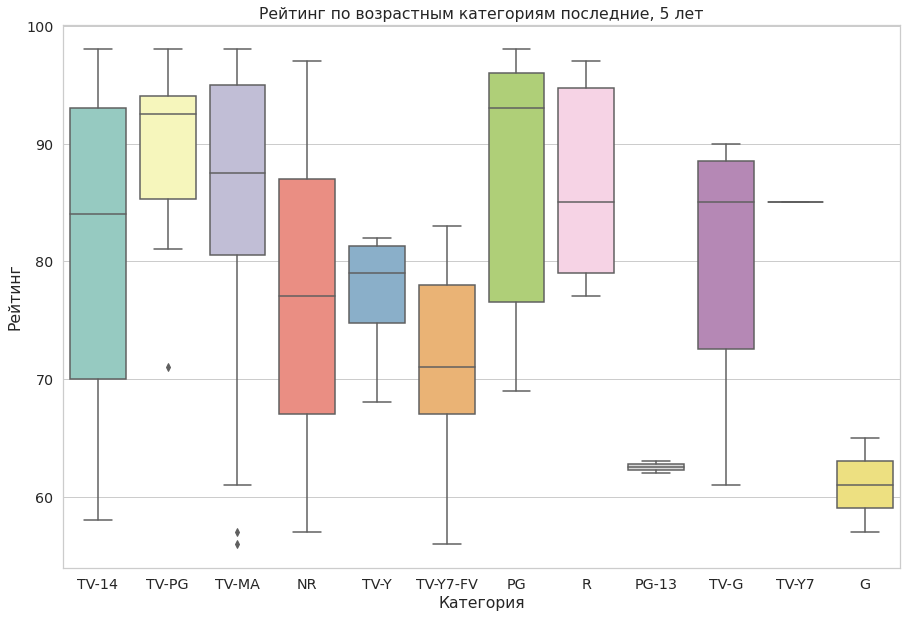

In [59]:
plt.figure(figsize=(15,10))
sns.boxplot(x='rating', y='user rating score', data=last_data.dropna(), palette='Set3')
plt.title('Рейтинг по возрастным категориям последние, 5 лет')
plt.xlabel('Категория')
plt.ylabel('Рейтинг')
plt.show()

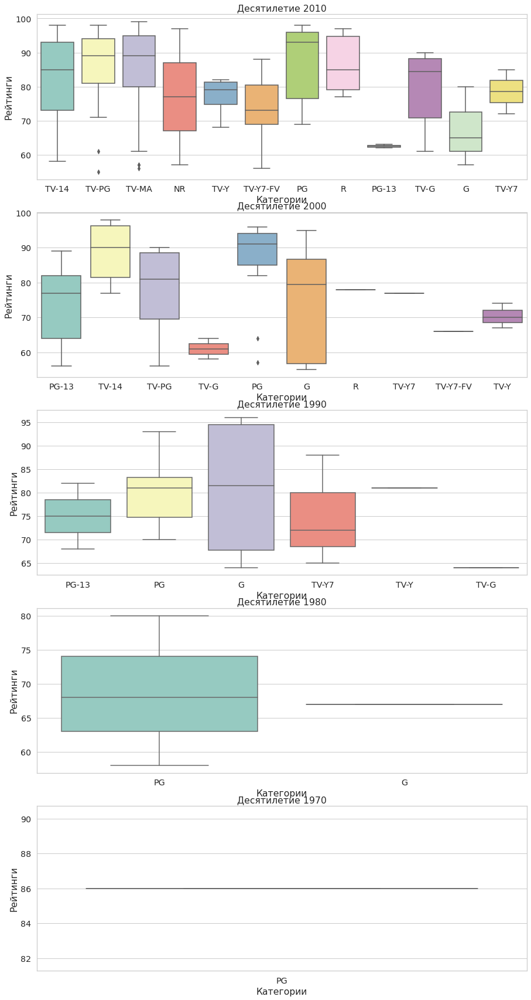

In [60]:
data['decade'] = data['release year'] // 10 * 10
decade_ratings = data[['rating', 'user rating score', 'decade']].dropna()

fig, axes = plt.subplots(5, 1, figsize=(15, 30))
for i in range(5):
    sns.boxplot(ax=axes[i], x=decade_ratings[decade_ratings['decade'] == (2010 - i * 10)]['rating'],
                y=decade_ratings[decade_ratings['decade'] == (2010 - i * 10)]['user rating score'],
                palette = 'Set3')
    
    axes[i].set_title('Десятилетие {}'.format(2010 - i * 10))
    axes[i].set_xlabel('Категории')
    axes[i].set_ylabel('Рейтинги')


**Вывод:** На основе первого графика можно говорить о том, что в категориях TV-14 и NR разброс очень велик, там появлялись как очень успешные, так и плохо оценненные зрителями проекты. Выделяется группа TV-PG, с маленьким разбросом и высоким средним. Категорию G можно смело считать неудачной, в категории PG-13 слишком мало данных. Думаю, компании стоит выкладываться в проекты с категориями PG, TV-MA, TV-PG, их оценивают все лучше и лучше.

Согласно второму графику, средняя оценка всех выпущенных шоу увеличивается с течением времени. Возможно, это связано с развитием Интеренет технологий, но скорее с тем, что выпусается все больше и больше шоу для своих целевых категорий, чтобы каждый человек мог найти то, что ему нравится, поэтому отдельно взятый человек скорее найдет сериал по душе и хорошо его оценит, чем будет смотреть то, что не интересно и ставить низкие рейтинги. В 80-х было всего 2 категории, сейчас же их 12, и их количество растет.

---
### Задача 4

В данной задаче вам нужно будет продолжить анализ данных о видео на YouTube. Информация об имени категории видео содержится в файле `RU_category_id.json`. Следующий код читает этот файл, извлекает из него необходимую информацию, и записывает в виде `pandas`-таблицы.

In [61]:
import json

with open('./RU_category_id.json') as json_file:
    json_data = json.load(json_file)
    
category = pd.DataFrame(columns=['id', 'name'])

for item in json_data['items']:
    category = category.append(
        {'id': int(item['id']),
         'name': item['snippet']['title']},
        ignore_index=True
    )
    
category['id'] = category['id'].astype(int)
category

,id,name
0,1,Film & Animation
1,2,Autos & Vehicles
2,10,Music
3,15,Pets & Animals
4,17,Sports
5,18,Short Movies
6,19,Travel & Events
7,20,Gaming
8,21,Videoblogging
9,22,People & Blogs


Добавьте к вашим данным имена категорий с помощью `pd.merge`.

In [62]:
new_dataset_youtube = dataset_youtube.merge(category, how='left', left_on='category_id', right_on='id')
new_dataset_youtube.drop('id', axis=1, inplace=True)
new_dataset_youtube

,trending_date,category_id,views,likes,dislikes,comment_count,name
0,14,22,62408,334,190,50,People & Blogs
1,14,22,330043,43841,2244,2977,People & Blogs
2,14,24,424596,49854,714,2944,Entertainment
3,14,22,112851,3566,122,80,People & Blogs
4,14,24,243469,36216,631,1692,Entertainment
...,...,...,...,...,...,...,...
1595,21,2,5498,373,19,49,Autos & Vehicles
1596,21,2,40394,1339,179,201,Autos & Vehicles
1597,21,25,3516,65,7,4,News & Politics
1598,21,25,47507,4372,231,2380,News & Politics


Составьте сводную таблицу о количестве просмотров по дням для каждой категории видео с помощю функции `pivot_table`.

In [63]:
table_views_categories = new_dataset_youtube.pivot_table(index='name', columns='trending_date', 
                                                         values='views', aggfunc='sum')
table_views_categories

trending_date,14,15,16,17,18,19,20,21
name,,,,,,,,
Autos & Vehicles,1350890.0,2076443.0,2051608.0,1386676.0,1713087.0,1736740.0,962761.0,1421017.0
Comedy,2310887.0,4152389.0,4156893.0,3556025.0,3806238.0,3556578.0,5648120.0,4627423.0
Education,139723.0,28850.0,6963.0,146943.0,256076.0,310830.0,270585.0,186909.0
Entertainment,5010384.0,5289490.0,3373346.0,12299938.0,7519942.0,5877590.0,8174020.0,4585563.0
Film & Animation,636616.0,931837.0,1160112.0,1820958.0,2725012.0,1075440.0,2574276.0,2532978.0
Gaming,885597.0,1609621.0,1583149.0,557074.0,600307.0,193316.0,851814.0,981217.0
Howto & Style,2191619.0,1562421.0,129763.0,1250164.0,1468139.0,156958.0,1402284.0,350009.0
Music,733907.0,1585619.0,4720464.0,9179397.0,6972429.0,1329904.0,1527219.0,809274.0
News & Politics,1010044.0,1225112.0,1174092.0,1251367.0,1056007.0,1028665.0,657263.0,1214178.0


Визуализируйте таблицу с помощью `heatmap`. Для информативности поделите все числа на $10^6$.

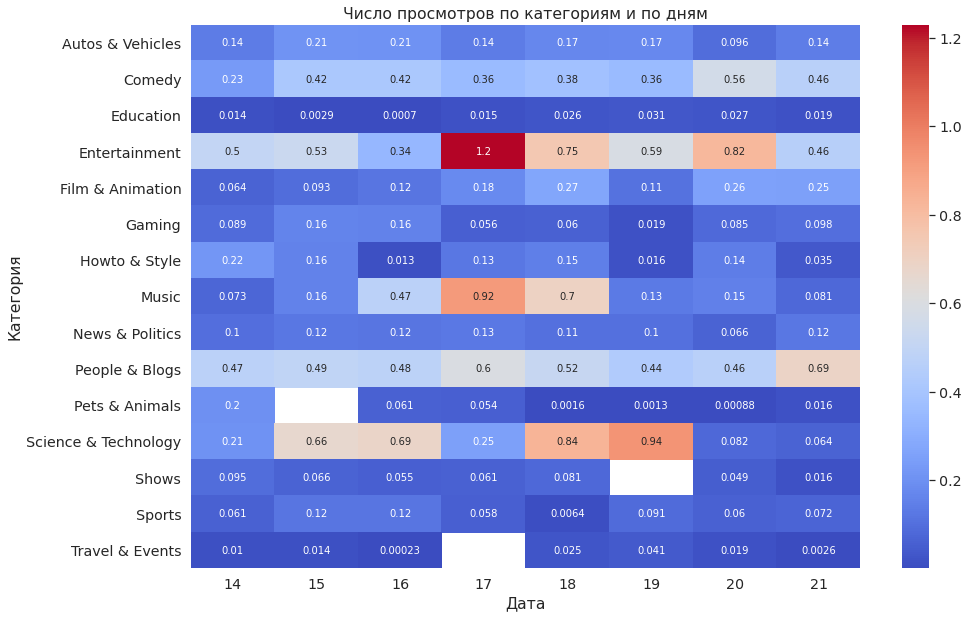

In [64]:
plt.figure(figsize=(15,10))
sns.heatmap(table_views_categories / 10e6 ,cmap='coolwarm', annot=True)
plt.title('Число просмотров по категориям и по дням')
plt.xlabel('Дата')
plt.ylabel('Категория')
plt.show()

Сделайте аналогичную сводную таблицу, добавив суммы по строкам и столбцам, назвав их "Всего просмотров".

In [65]:
new_table_views_categories = new_dataset_youtube.pivot_table(index='name', columns='trending_date', 
                                                         values='views', aggfunc='sum')

new_table_views_categories['Всего просмотров'] = new_table_views_categories.sum(axis=1)
new_table_views_categories = new_table_views_categories.append(
    pd.Series(new_table_views_categories.sum(), name='Всего просмотров'))
new_table_views_categories

trending_date,14,15,16,17,18,19,20,21,Всего просмотров
name,,,,,,,,,
Autos & Vehicles,1350890.0,2076443.0,2051608.0,1386676.0,1713087.0,1736740.0,962761.0,1421017.0,12699222.0
Comedy,2310887.0,4152389.0,4156893.0,3556025.0,3806238.0,3556578.0,5648120.0,4627423.0,31814553.0
Education,139723.0,28850.0,6963.0,146943.0,256076.0,310830.0,270585.0,186909.0,1346879.0
Entertainment,5010384.0,5289490.0,3373346.0,12299938.0,7519942.0,5877590.0,8174020.0,4585563.0,52130273.0
Film & Animation,636616.0,931837.0,1160112.0,1820958.0,2725012.0,1075440.0,2574276.0,2532978.0,13457229.0
Gaming,885597.0,1609621.0,1583149.0,557074.0,600307.0,193316.0,851814.0,981217.0,7262095.0
Howto & Style,2191619.0,1562421.0,129763.0,1250164.0,1468139.0,156958.0,1402284.0,350009.0,8511357.0
Music,733907.0,1585619.0,4720464.0,9179397.0,6972429.0,1329904.0,1527219.0,809274.0,26858213.0
News & Politics,1010044.0,1225112.0,1174092.0,1251367.0,1056007.0,1028665.0,657263.0,1214178.0,8616728.0


In [66]:
table = new_dataset_youtube.pivot_table(index='name', columns='trending_date', 
                                                         values='views', aggfunc='sum')
table['Всего просмотров'] = new_table_views_categories.sum(axis=1)
table

trending_date,14,15,16,17,18,19,20,21,Всего просмотров
name,,,,,,,,,
Autos & Vehicles,1350890.0,2076443.0,2051608.0,1386676.0,1713087.0,1736740.0,962761.0,1421017.0,25398444.0
Comedy,2310887.0,4152389.0,4156893.0,3556025.0,3806238.0,3556578.0,5648120.0,4627423.0,63629106.0
Education,139723.0,28850.0,6963.0,146943.0,256076.0,310830.0,270585.0,186909.0,2693758.0
Entertainment,5010384.0,5289490.0,3373346.0,12299938.0,7519942.0,5877590.0,8174020.0,4585563.0,104260546.0
Film & Animation,636616.0,931837.0,1160112.0,1820958.0,2725012.0,1075440.0,2574276.0,2532978.0,26914458.0
Gaming,885597.0,1609621.0,1583149.0,557074.0,600307.0,193316.0,851814.0,981217.0,14524190.0
Howto & Style,2191619.0,1562421.0,129763.0,1250164.0,1468139.0,156958.0,1402284.0,350009.0,17022714.0
Music,733907.0,1585619.0,4720464.0,9179397.0,6972429.0,1329904.0,1527219.0,809274.0,53716426.0
News & Politics,1010044.0,1225112.0,1174092.0,1251367.0,1056007.0,1028665.0,657263.0,1214178.0,17233456.0


В чем проблема с информативностью подобных таблиц? Исправьте это.

*Подсказка*: посмотрите на графики, которые вы построили ранее. 

Кажется, что просто очень много чисел, нет возможности посмотрев один раз, запомнить популярные категории, числа тяжело сравнивать друг с другом. Двумерность массива тоже добавляет проблем. На heatmap же легко выделяются закономерности, видны горячие и холодные области.

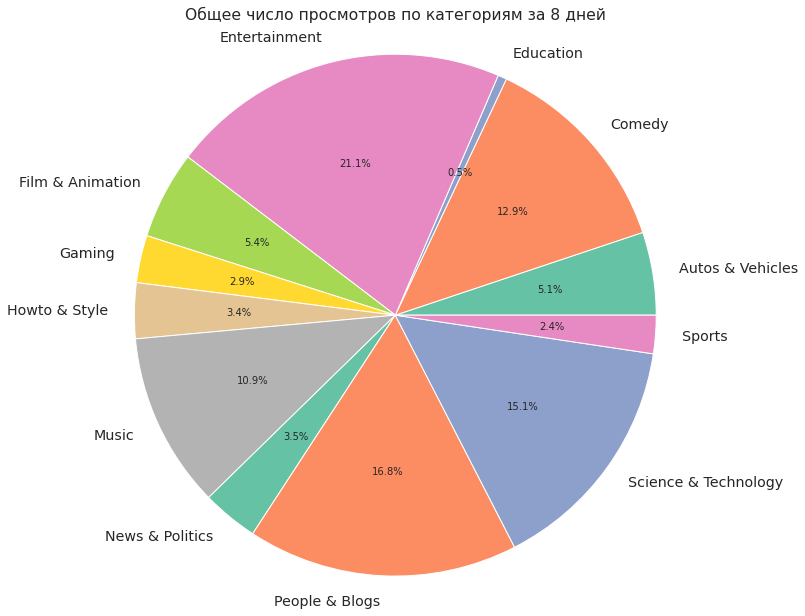

In [67]:
# пример того, как это должно выглядеть для суммы просмотров по всем дням недели
plt.figure(figsize=(10, 10))

plt.pie(
    table.dropna().iloc[:, 8],
    radius=1.2,
    autopct='%.1f%%', 
    labels=table.dropna().index
)
plt.title('Общее число просмотров по категориям за 8 дней\n')

plt.show()

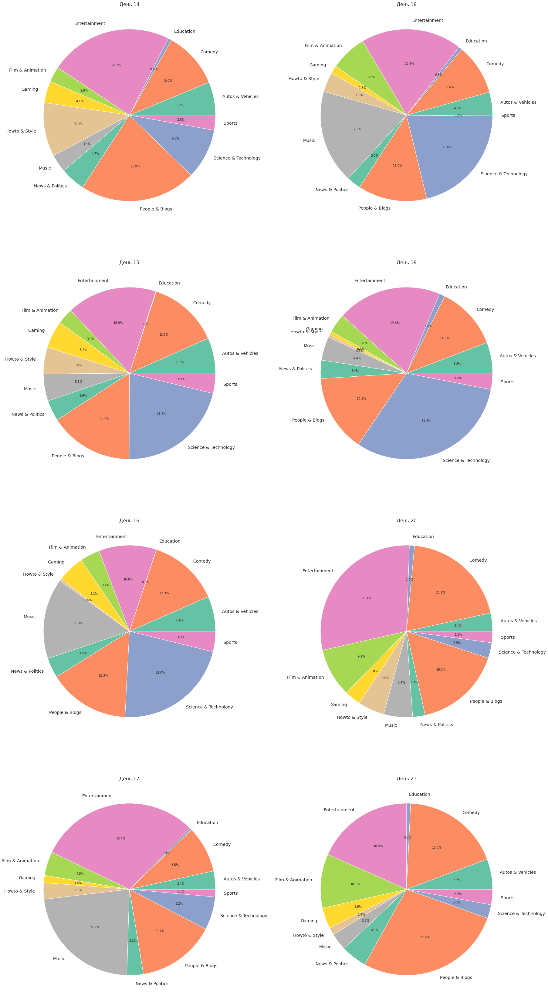

In [68]:
fig, axes = plt.subplots(4, 2, figsize=(30, 60))

i = 0
for i in range(4):
    for j in range(2):
        axes[i, j].pie(
        table_views_categories.dropna().iloc[:, i + j * 4],
        radius=1.0,
        autopct='%.1f%%', 
        labels=table_views_categories.dropna().index )   
        
        axes[i, j].set_title('День {}'.format(14+i+j*4))

plt.show()

**Вывод:** Кажется, такое представления данных гораздо нагляднее сводной таблицы. 
Судя по чартам, можно выделить дни, когда наблюдался пик популярности каналов на темы Science&Technology -- $18$ и $19$ число, сколько и выходных дней. Также есть день, когда был пик просмотров категории Entertainment и проуслышивания музыки $17$ и $18$ числа. Посмотрев на календарь, можно понять, что $17$ число это как раз пятница. Скорее всего вечером в эти дни все уставшие люди позволяют себе расслабиться и посмтреть что-то развлекательное.

Также стоит отметить, что и на heatmap также хорошо видны описанные выше закономерности.

Более того, в топах просмотров обычно Science&Technology и Entertainment, в сумме они составляют почти половину. Также выбиваются такие жанры, как Music, Comedy, People&Blogs. Последние две достаточно постоянны по популярности в течение недели. На удивление, Education и Sports совсем непопулярны.

---

### Задача 5

<a target="_blank" href="yelp.com">Yelp</a> — веб-сайт для поиска на местном рынке услуг, например ресторанов или парикмахерских, с возможностью добавлять и просматривать рейтинги и обзоры этих услуг. Для популярных бизнесов имеются сотни обзоров. Для обозревателей на сайте предусмотрены элементы социальной сети.

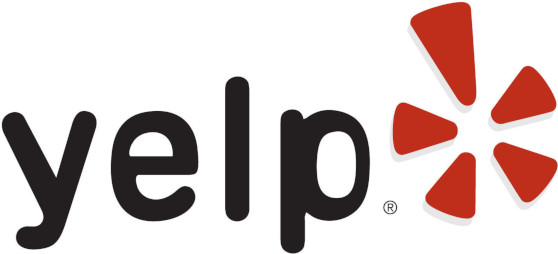

_____________

Вам предоставляется следующая информация о компаниях на Yelp:

Файл `yelp_business.csv`:
* `business_id` — уникальный идентификатор компании;
* `name` — имя компании;
* `address`, `city`, `state` — месторасположении компании;
* `latitude`, `longitude` — географические координаты;
* `categories` — категории услуг компании.

Файл `yelp_review.csv`, содержащий оценки пользователей:
* `business_id` — идентификатор компании, соответствующий файлу `yelp_business.csv`;
* `stars` — поставленная пользователем оценка от 1 до 5.

В целях сокращения объема файла, текстовые отзывы пользователей не были включены.

Оригинальную версию датасета в формате `json` можно посмотреть по <a target="_blank" href="https://www.kaggle.com/yelp-dataset/yelp-dataset/data">ссылке</a>.

_____________

**Что нужно сделать:** 

* Найти город с наибольшим количеством компаний;
* Для этого города определить районы с наиболее качественными услугами. <a target="_blank" href="https://yandex.ru/company/researches/2017/msk_mobile_map">Пример</a> с несколько другой задачей.
* А также найти рестораны с наилучшими отзывами.

------

#### Город с наибольшим количеством компаний

Загрузите данные из файла `yelp_business.csv` с помощью функции `pd.read_csv`. Посмотрите на первые несколько строк с помощью метода `head`.

In [69]:
dataset_yelp = pd.read_csv('yelp_business.csv')
dataset_yelp.head(10)

,Unnamed: 0,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories
0,0,FYWN1wneV18bWNgQjJ2GNg,"""Dental by Design""",NaN,"""4855 E Warner Rd, Ste B9""",Ahwatukee,AZ,85044,33.330690,-111.978599,1,Dentists;General Dentistry;Health & Medical;Or...
1,1,He-G7vWjzVUysIKrfNbPUQ,"""Stephen Szabo Salon""",NaN,"""3101 Washington Rd""",McMurray,PA,15317,40.291685,-80.104900,1,Hair Stylists;Hair Salons;Men's Hair Salons;Bl...
2,2,KQPW8lFf1y5BT2MxiSZ3QA,"""Western Motor Vehicle""",NaN,"""6025 N 27th Ave, Ste 1""",Phoenix,AZ,85017,33.524903,-112.115310,1,Departments of Motor Vehicles;Public Services ...
3,3,8DShNS-LuFqpEWIp0HxijA,"""Sports Authority""",NaN,"""5000 Arizona Mills Cr, Ste 435""",Tempe,AZ,85282,33.383147,-111.964725,0,Sporting Goods;Shopping
4,4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap""",NaN,"""581 Howe Ave""",Cuyahoga Falls,OH,44221,41.119535,-81.475690,1,American (New);Nightlife;Bars;Sandwiches;Ameri...
5,5,o9eMRCWt5PkpLDE0gOPtcQ,"""Messina""",NaN,"""Richterstr. 11""",Stuttgart,BW,70567,48.727200,9.147950,1,Italian;Restaurants
6,6,kCoE3jvEtg6UVz5SOD3GVw,"""BDJ Realty""",Summerlin,"""2620 Regatta Dr, Ste 102""",Las Vegas,NV,89128,36.207430,-115.268460,1,Real Estate Services;Real Estate;Home Services...
7,7,OD2hnuuTJI9uotcKycxg1A,"""Soccer Zone""",NaN,"""7240 W Lake Mead Blvd, Ste 4""",Las Vegas,NV,89128,36.197484,-115.249660,1,Shopping;Sporting Goods
8,8,EsMcGiZaQuG1OOvL9iUFug,"""Any Given Sundae""",NaN,"""2612 Brandt School Rd""",Wexford,PA,15090,40.615102,-80.091349,1,Coffee & Tea;Ice Cream & Frozen Yogurt;Food
9,9,TGWhGNusxyMaA4kQVBNeew,"""Detailing Gone Mobile""",NaN,"""""",Henderson,NV,89014,36.055825,-115.046350,1,Automotive;Auto Detailing


Найдите пять городов, по которым присутствует информация о наибольшем количестве компаний. В таблице должен быть указан город (название) и количество компаний в этом городе.

*Подсказка.* Для выполнения стоит воспользоваться методами `groupby`, `count`, `sort_values`, `head`.

In [70]:
cities = dataset_yelp.groupby('city')['business_id'].count()
cities = cities.sort_values(ascending=False).dropna()
cities.head(5)

city
Las Vegas     26775
Phoenix       17213
Toronto       17206
Charlotte      8553
Scottsdale     8228
Name: business_id, dtype: int64

Пусть `N` &mdash; город с наибольшим количеством компаний. Оставьте в таблице только записи, соответствующие городу `N`. Нанесите все эти компании на график, в котором по оси $x$ отметьте долготу, а по оси $y$ &mdash; широту.

In [71]:
big_city = cities.index[0]

In [72]:
dataset_city = dataset_yelp[dataset_yelp['city'] == big_city]
dataset_city.head(5)

,Unnamed: 0,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories
6,6,kCoE3jvEtg6UVz5SOD3GVw,"""BDJ Realty""",Summerlin,"""2620 Regatta Dr, Ste 102""",Las Vegas,NV,89128,36.207430,-115.268460,1,Real Estate Services;Real Estate;Home Services...
7,7,OD2hnuuTJI9uotcKycxg1A,"""Soccer Zone""",NaN,"""7240 W Lake Mead Blvd, Ste 4""",Las Vegas,NV,89128,36.197484,-115.249660,1,Shopping;Sporting Goods
26,26,VBHEsoXQb2AQ76J9l8h1uQ,"""Alfredo's Jewelry""",Southeast,"""5775 S Eastern, Ste 103""",Las Vegas,NV,89119,36.085051,-115.119421,1,Shopping;Jewelry;Watch Repair;Local Services
41,41,1Jp_hmPNUZArNqzpbm7B0g,"""Task Electric""",Spring Valley,"""7260 Cimarron Rd, Ste 130""",Las Vegas,NV,89113,36.056382,-115.269332,1,Home Services;Lighting Fixtures & Equipment;Lo...
48,48,DPQnTnNw2PJj7DdENM98Cw,"""Star Nursery""",NaN,"""5340 Boulder Hwy""",Las Vegas,NV,89122,36.105196,-115.056880,1,Nurseries & Gardening;Home & Garden;Shopping


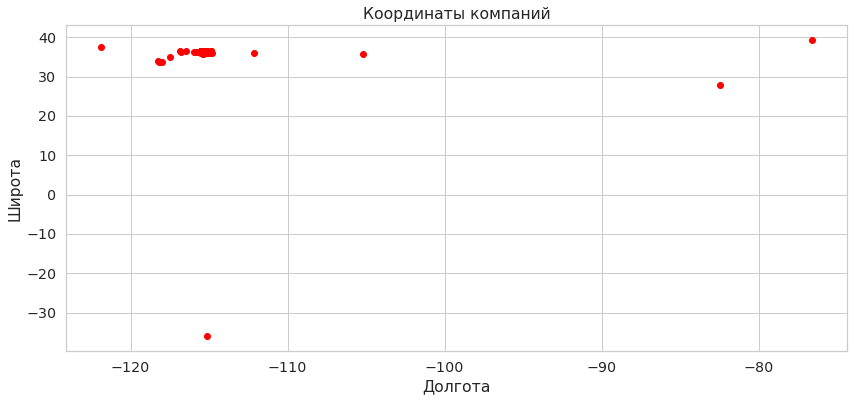

In [73]:
plt.figure(figsize=(14, 6))
plt.scatter(
    dataset_city['longitude'],
    dataset_city['latitude'],
    color='red'
)
plt.title('Координаты компаний')
plt.xlabel('Долгота')
plt.ylabel('Широта')
plt.show()

Сам город находится в сгустке точек. Есть какие-то компании, которые приписаны к этому городу, но находятся далеко от него. Избавьтесь от них, подобрав некоторые границы значений широты и долготы. Изобразите все компании на новом графике. 

На этом графике должны выделяться некоторые улицы. Откройте карту города `N` и сравните ее с построенным графиком. Попробуйте также для графиков в этой задаче автоматически подгружать карту города в качестве фона графика, используя <a href="https://plotly.com/python/scattermapbox/">примеры</a>.

*Замечание. Если у вас возникает ошибка `Notebook validation failed`, попробуйте открыть ноутбук текстовым редактором и в самом конце заменить `"nbformat_minor": 1` на `"nbformat_minor": 4`.*

In [74]:
dataset_city = dataset_city[((dataset_city['longitude'] < -115.0) & (dataset_city['longitude'] > -115.40))]
dataset_city = dataset_city[((dataset_city['latitude'] > 35.9) & (dataset_city['latitude'] < 36.40))]

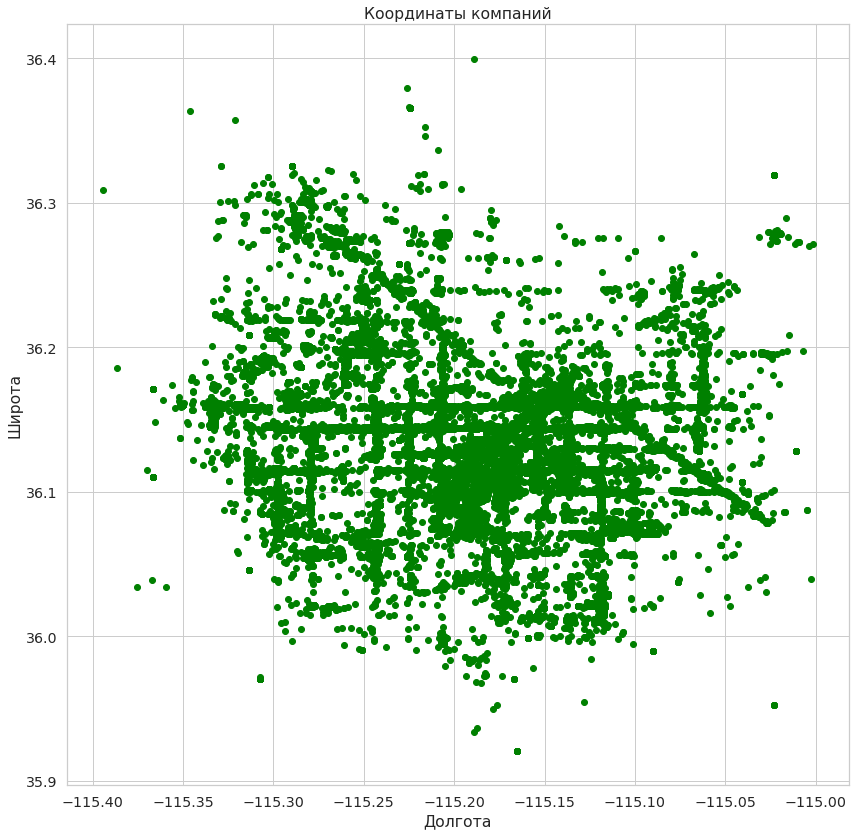

In [75]:
plt.figure(figsize=(14, 14))
plt.scatter(
    dataset_city['longitude'],
    dataset_city['latitude'],
    color='green'
)
plt.title('Координаты компаний')
plt.xlabel('Долгота')
plt.ylabel('Широта')
plt.show()


Уже хорошо проглядываются улицы. Посмотрим на карте.

In [76]:
import plotly.express as px

fig = px.scatter_mapbox(
    dataset_city, 
    lat='latitude',
    lon='longitude',
    hover_name = 'name',
    zoom=10,
    title='Координаты компаний')

fig.update_layout(mapbox_style = "open-street-map")
fig.show()

#### Оценки компаний

Для выполнения задания нужно посчитать среднюю оценку каждой компании, а также количество выставленных оценок.

Загрузите таблицу оценок `yelp_review.csv`.

In [77]:
dataset_reviews = pd.read_csv('yelp_review.csv')
dataset_reviews = dataset_reviews.drop(['Unnamed: 0'], axis=1)
dataset_reviews

,business_id,stars
0,AEx2SYEUJmTxVVB18LlCwA,5
1,VR6GpWIda3SfvPC-lg9H3w,5
2,CKC0-MOWMqoeWf6s-szl8g,5
3,ACFtxLv8pGrrxMm6EgjreA,4
4,s2I_Ni76bjJNK9yG60iD-Q,4
...,...,...
5261663,Ngk84Ax1tXgpoJFEGxot3w,1
5261664,pOEL97ld-FJMKO8Ki8JmYg,3
5261665,5ubokMNw8qfbX2WtxgJG1Q,4
5261666,EO3i5kTUG7_S2OIQ23sdSA,3


В подгруженной таблице оценок оставьте только компании города `N`. Для этого установите значения `business_id` в качестве индекса у таблицы оценок и воспользуйтесь методом `loc`. 

*Подсказка.* Чтобы индекс снова сделать полем таблицы, можно воспользоваться методом `reset_index`.

In [78]:
dataset_reviews = dataset_reviews.set_index('business_id').loc[dataset_city['business_id']].reset_index()   
dataset_reviews

,business_id,stars
0,kCoE3jvEtg6UVz5SOD3GVw,4
1,kCoE3jvEtg6UVz5SOD3GVw,1
2,kCoE3jvEtg6UVz5SOD3GVw,5
3,kCoE3jvEtg6UVz5SOD3GVw,5
4,kCoE3jvEtg6UVz5SOD3GVw,5
...,...,...
1600777,9ouC6BpmjFpLfHeQnLQqng,5
1600778,9ouC6BpmjFpLfHeQnLQqng,5
1600779,n9a-3YhibkMDUEgncIivHg,5
1600780,n9a-3YhibkMDUEgncIivHg,1


Теперь посчитайте среднюю оценку каждой компании, а также количество выставленных компании оценок. 

*Подсказка.* Помочь в этом могут функции `groupby` и `aggregate([np.mean, np.size])`.

In [79]:
ratings_companies = dataset_reviews.groupby('business_id').aggregate([np.mean, np.size])
ratings_companies = ratings_companies.reset_index('business_id')
ratings_companies

business_id     stars      
                                   mean  size
0      --9e1ONYQuAa-CB_Rrw7Tw  4.088904  1451
1      --DdmeR16TRb3LsjG0ejrQ  3.200000     5
2      --WsruI0IGEoeRmkErU5Gg  4.928571    14
3      --Y7NhBKzLTbNliMUX_wfg  4.875000     8
4      --e8PjCNhEz32pprnPhCwQ  3.473684    19
...                       ...       ...   ...
26680  zzOo9n22fBbKAhbSpMzggA  3.230769    26
26681  zzXuJF6UUT1kgTyCsmgDmQ  5.000000     4
26682  zzjqFOujmM9surbMANZ_ag  5.000000     3
26683  zzsKbL1KMNJqazSqBXskxQ  3.666667     6
26684  zzzaIBwimxVej4tY6qFOUQ  3.432432    37

[26685 rows x 3 columns]

In [80]:
ratings_companies.columns = ratings_companies.columns.droplevel(0)
ratings_companies

,,mean,size
0,--9e1ONYQuAa-CB_Rrw7Tw,4.088904,1451
1,--DdmeR16TRb3LsjG0ejrQ,3.200000,5
2,--WsruI0IGEoeRmkErU5Gg,4.928571,14
3,--Y7NhBKzLTbNliMUX_wfg,4.875000,8
4,--e8PjCNhEz32pprnPhCwQ,3.473684,19
...,...,...,...
26680,zzOo9n22fBbKAhbSpMzggA,3.230769,26
26681,zzXuJF6UUT1kgTyCsmgDmQ,5.000000,4
26682,zzjqFOujmM9surbMANZ_ag,5.000000,3
26683,zzsKbL1KMNJqazSqBXskxQ,3.666667,6


Назовите колонки таблицы красивыми именами, изменив `<имя таблицы>.columns`, после чего напечатайте несколько строк полученной таблицы. Красивые имена &mdash; то, что будет понятно простому человеку при чтении ваших результатов. Как именно их назвать &mdash; задача аналитика, то есть в данном случае ваша.

In [81]:
ratings_companies.columns = ['id', 'average_rating', 'num_of_reviews']
ratings_companies

,id,average_rating,num_of_reviews
0,--9e1ONYQuAa-CB_Rrw7Tw,4.088904,1451
1,--DdmeR16TRb3LsjG0ejrQ,3.200000,5
2,--WsruI0IGEoeRmkErU5Gg,4.928571,14
3,--Y7NhBKzLTbNliMUX_wfg,4.875000,8
4,--e8PjCNhEz32pprnPhCwQ,3.473684,19
...,...,...,...
26680,zzOo9n22fBbKAhbSpMzggA,3.230769,26
26681,zzXuJF6UUT1kgTyCsmgDmQ,5.000000,4
26682,zzjqFOujmM9surbMANZ_ag,5.000000,3
26683,zzsKbL1KMNJqazSqBXskxQ,3.666667,6


Соедините две полученные ранее таблицы по компаниям города `N` в одну.
Для этого сначала установите поле `business_id` в качестве индекса в обеих таблицах с помощью `set_index`. В одной из них это уже должно было быть сделано.
В полученной таблице должны получится поля `latitude`, `longitude`, `categories`, `name`, `stars`, `count`.

*Подсказка.* Соединение таблиц можно выполнить с помощью `join`.
Индексы у этих таблиц одинаковые, так что тип джойна не имеет значения.

In [82]:
dataset_city = dataset_city.drop(['Unnamed: 0', 'neighborhood', 'address', 'state', 'postal_code', 'is_open'], axis=1)
dataset_city

,business_id,name,city,latitude,longitude,categories
6,kCoE3jvEtg6UVz5SOD3GVw,"""BDJ Realty""",Las Vegas,36.207430,-115.268460,Real Estate Services;Real Estate;Home Services...
7,OD2hnuuTJI9uotcKycxg1A,"""Soccer Zone""",Las Vegas,36.197484,-115.249660,Shopping;Sporting Goods
26,VBHEsoXQb2AQ76J9l8h1uQ,"""Alfredo's Jewelry""",Las Vegas,36.085051,-115.119421,Shopping;Jewelry;Watch Repair;Local Services
41,1Jp_hmPNUZArNqzpbm7B0g,"""Task Electric""",Las Vegas,36.056382,-115.269332,Home Services;Lighting Fixtures & Equipment;Lo...
48,DPQnTnNw2PJj7DdENM98Cw,"""Star Nursery""",Las Vegas,36.105196,-115.056880,Nurseries & Gardening;Home & Garden;Shopping
...,...,...,...,...,...,...
174539,swjz4q8gI79Ndg4APuHEUA,"""Stonegate Real Estate Services""",Las Vegas,36.134355,-115.224462,Real Estate Services;Home Services;Property Ma...
174545,pUhU5ohYv65g8B47dTXAKA,"""Starbucks""",Las Vegas,36.173589,-115.116779,Coffee & Tea;Food
174546,sH9WsMj8sNTTSAUWv4UEEg,"""Sprint Store""",Las Vegas,36.055130,-115.243488,Mobile Phone Accessories;Mobile Phones;Electro...
174552,9ouC6BpmjFpLfHeQnLQqng,"""9 Dragons Fight Shop""",Las Vegas,36.128780,-115.208990,Martial Arts;Sports Wear;Men's Clothing;Sporti...


In [83]:
dataset_city = dataset_city.set_index('business_id')

all_info_reviews = dataset_city.join(ratings_companies.set_index('id'))
all_info_reviews = all_info_reviews.reset_index()
all_info_reviews

,business_id,name,city,latitude,longitude,categories,average_rating,num_of_reviews
0,kCoE3jvEtg6UVz5SOD3GVw,"""BDJ Realty""",Las Vegas,36.207430,-115.268460,Real Estate Services;Real Estate;Home Services...,4.000000,5
1,OD2hnuuTJI9uotcKycxg1A,"""Soccer Zone""",Las Vegas,36.197484,-115.249660,Shopping;Sporting Goods,1.444444,9
2,VBHEsoXQb2AQ76J9l8h1uQ,"""Alfredo's Jewelry""",Las Vegas,36.085051,-115.119421,Shopping;Jewelry;Watch Repair;Local Services,4.739130,23
3,1Jp_hmPNUZArNqzpbm7B0g,"""Task Electric""",Las Vegas,36.056382,-115.269332,Home Services;Lighting Fixtures & Equipment;Lo...,4.450000,20
4,DPQnTnNw2PJj7DdENM98Cw,"""Star Nursery""",Las Vegas,36.105196,-115.056880,Nurseries & Gardening;Home & Garden;Shopping,3.680000,25
...,...,...,...,...,...,...,...,...
26680,swjz4q8gI79Ndg4APuHEUA,"""Stonegate Real Estate Services""",Las Vegas,36.134355,-115.224462,Real Estate Services;Home Services;Property Ma...,4.466667,15
26681,pUhU5ohYv65g8B47dTXAKA,"""Starbucks""",Las Vegas,36.173589,-115.116779,Coffee & Tea;Food,2.400000,35
26682,sH9WsMj8sNTTSAUWv4UEEg,"""Sprint Store""",Las Vegas,36.055130,-115.243488,Mobile Phone Accessories;Mobile Phones;Electro...,3.857143,35
26683,9ouC6BpmjFpLfHeQnLQqng,"""9 Dragons Fight Shop""",Las Vegas,36.128780,-115.208990,Martial Arts;Sports Wear;Men's Clothing;Sporti...,5.000000,5


Изобразите все компании на графике, раскрасив точку в цвет, оттенок которого соответствует средней оценке компании. Прозрачность точки выставляйте не более $0.3$.

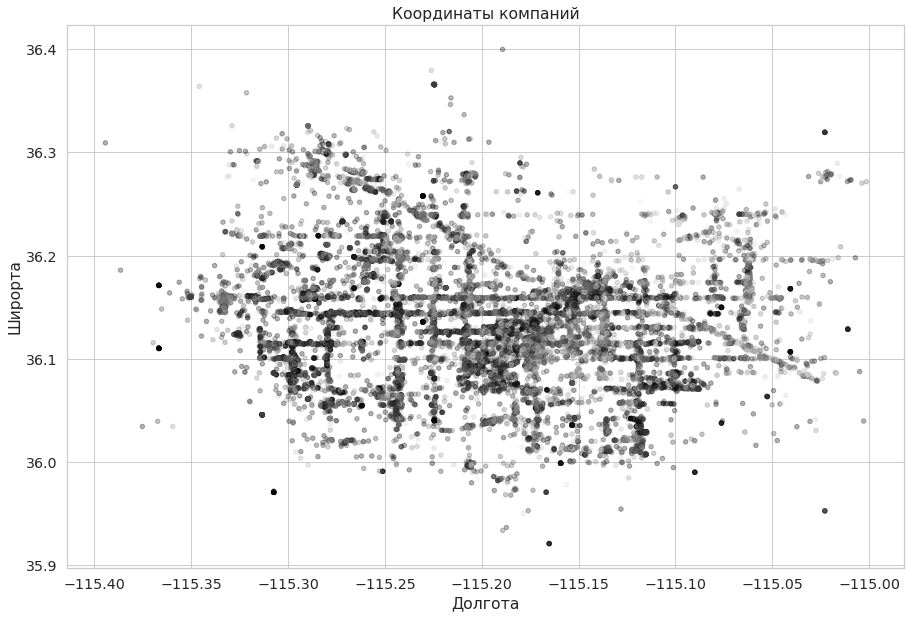

In [84]:
all_info_reviews.plot('longitude', 
                      'latitude',
                        c=list(all_info_reviews['average_rating']),
                        kind='scatter',
                        alpha=0.3, 
                        figsize=[15, 10])
plt.title('Координаты компаний')
plt.xlabel('Долгота')
plt.ylabel('Широрта')
plt.show()

Чтобы получить районы города, то есть разделить город на "клетки", округлите значения широты и долготы, подобрав оптимальный размер района. 

*Подсказка.* Например, можно сделать так
`np.round(долгота*4, decimals=1)*0.25`.

In [85]:
round_info_reviews = all_info_reviews.copy()
round_info_reviews['longitude'] = round_info_reviews['longitude'].apply(lambda x : np.round(x * 4, decimals=1)*0.25)
round_info_reviews['latitude'] = round_info_reviews['latitude'].apply(lambda x : np.round(x * 4, decimals=1)*0.25)
round_info_reviews

,business_id,name,city,latitude,longitude,categories,average_rating,num_of_reviews
0,kCoE3jvEtg6UVz5SOD3GVw,"""BDJ Realty""",Las Vegas,36.200,-115.275,Real Estate Services;Real Estate;Home Services...,4.000000,5
1,OD2hnuuTJI9uotcKycxg1A,"""Soccer Zone""",Las Vegas,36.200,-115.250,Shopping;Sporting Goods,1.444444,9
2,VBHEsoXQb2AQ76J9l8h1uQ,"""Alfredo's Jewelry""",Las Vegas,36.075,-115.125,Shopping;Jewelry;Watch Repair;Local Services,4.739130,23
3,1Jp_hmPNUZArNqzpbm7B0g,"""Task Electric""",Las Vegas,36.050,-115.275,Home Services;Lighting Fixtures & Equipment;Lo...,4.450000,20
4,DPQnTnNw2PJj7DdENM98Cw,"""Star Nursery""",Las Vegas,36.100,-115.050,Nurseries & Gardening;Home & Garden;Shopping,3.680000,25
...,...,...,...,...,...,...,...,...
26680,swjz4q8gI79Ndg4APuHEUA,"""Stonegate Real Estate Services""",Las Vegas,36.125,-115.225,Real Estate Services;Home Services;Property Ma...,4.466667,15
26681,pUhU5ohYv65g8B47dTXAKA,"""Starbucks""",Las Vegas,36.175,-115.125,Coffee & Tea;Food,2.400000,35
26682,sH9WsMj8sNTTSAUWv4UEEg,"""Sprint Store""",Las Vegas,36.050,-115.250,Mobile Phone Accessories;Mobile Phones;Electro...,3.857143,35
26683,9ouC6BpmjFpLfHeQnLQqng,"""9 Dragons Fight Shop""",Las Vegas,36.125,-115.200,Martial Arts;Sports Wear;Men's Clothing;Sporti...,5.000000,5


Для получения средней оценки компании по району постройте сводную таблицу при помощи `pd.pivot_table`, взяв в качестве индексов и колонок округленные широту и долготу, а в качестве значений &mdash; оценки. Аггрегирующей функцией является среднее.

Изобразите полученную таблицу при помощи `sns.heatmap`.

In [86]:
table_round_reviews = round_info_reviews.pivot_table(index='latitude', columns='longitude',
                                             values='average_rating', aggfunc='mean')
table_round_reviews

longitude,-115.400,-115.375,-115.350,-115.325,-115.300,-115.275,-115.250,-115.225,-115.200,-115.175,-115.150,-115.125,-115.100,-115.075,-115.050,-115.025,-115.000
latitude,,,,,,,,,,,,,,,,,
35.925,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.076923,3.990898,NaN,NaN,NaN,NaN,NaN,NaN,NaN
35.950,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.285878,NaN,5.000000,NaN,NaN,NaN,4.433333,NaN
35.975,NaN,NaN,NaN,NaN,4.612219,NaN,NaN,NaN,3.843123,4.167973,1.906977,2.900000,NaN,NaN,NaN,NaN,NaN
36.000,NaN,NaN,NaN,NaN,3.208333,4.762295,4.302529,3.906832,3.613502,3.612390,3.880770,3.636286,4.198660,NaN,NaN,NaN,NaN
36.025,NaN,5.000000,3.000000,NaN,4.790476,3.604171,3.794697,3.805040,3.703742,3.715046,3.848701,3.816911,3.864451,4.055556,4.744444,4.041667,NaN
36.050,NaN,4.230769,NaN,4.670557,4.221316,3.842713,3.901902,3.978581,3.556673,3.495257,3.652395,3.896634,4.503727,4.698148,3.897059,3.625000,4.782609
36.075,NaN,NaN,NaN,4.142940,3.915432,3.767066,3.872547,3.899610,3.933588,3.799274,3.068558,3.763387,4.008065,3.722999,3.686478,3.054114,NaN
36.100,NaN,4.743811,NaN,4.079151,3.960299,4.095504,3.560315,3.359652,3.790297,3.545192,3.424062,3.566896,3.601647,3.491457,3.406798,3.598012,3.826087
36.125,NaN,3.666667,3.832143,4.014740,3.861584,3.980037,3.620665,3.809718,3.703116,3.691397,3.340641,3.427996,3.665859,3.232973,3.434996,3.272421,4.653968


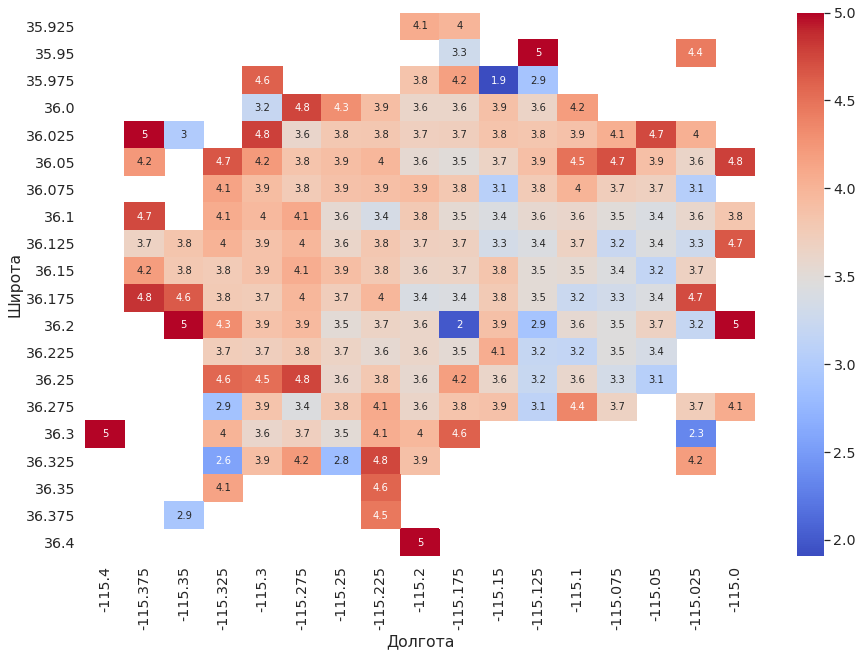

In [87]:
plt.figure(figsize=(15,10))
sns.heatmap(table_round_reviews,cmap='coolwarm', annot=True)
plt.xlabel('Долгота')
plt.ylabel('Широта')
plt.show()

Полученный график имеет ряд недостатков. Во-первых, не очень правильно судить о районе, если в нем мало компаний. Во-вторых, на графике цветовая гамма автоматически подстроилась под минимальное и максимальное значения оценки.

Почему эти недостатки могут быть существенными?

**Ответ:** Очевидно, что там, где мало компаний, не совсем корректно рассуждать о средней оценке. Судя по heatmap кажется, что на окраинах города сервисы работают лучше, однако там может быть совсем мало компаний, буквально несколько.  Во-первых, оценки в районах с маленьким число компаний и, соотвественно, посетителей может давать неправильный результат, так как он основан на маленькой выборке. Во-вторых, присутствует накрутка лайков, то есть для какой-нибудь маленькой компании на окраине города выгодно написать несколько хороших отзывов. Тогда средний рейтинг всего района сильно подскочит.

Цветовая гамма подстраивается под значения, визуально кажется, что серенькие участки совсем плохие, однако они имеют рейтинг больше $3.5$, что достаточно хорошо. И опять же, так как есть районы, в которых по несколько сервисов с высоким рейтингом, heatmap отнормирует всех остальных по этому рейтингу.

Оставьте районы, в которых имеется информация о не менее $30$ компаний. Постройте новый график районов, использовав параметры `vmin` и `vmax` у функции `sns.heatmap`.

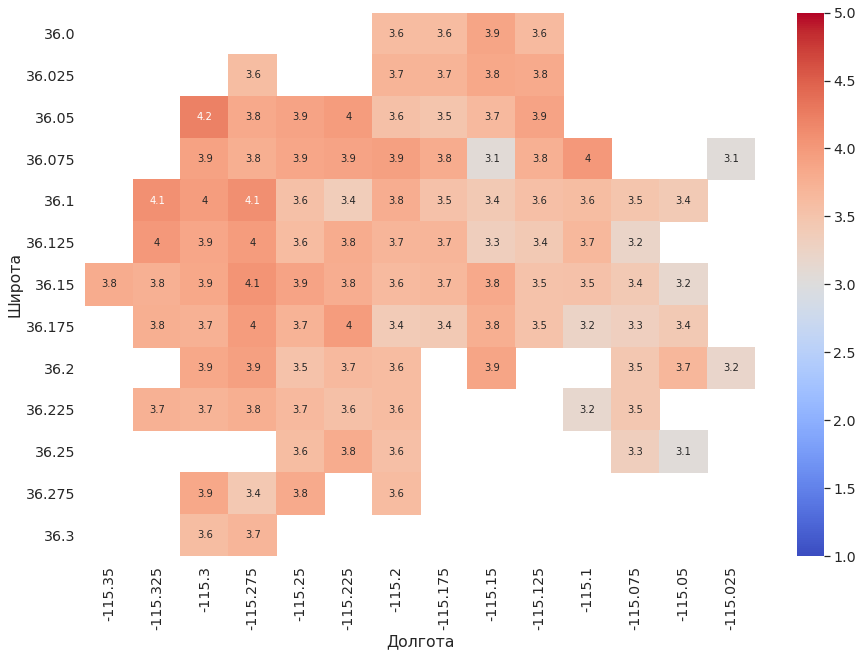

In [88]:
dataset_enough_info =  round_info_reviews.groupby(['latitude', 'longitude']).aggregate([np.mean, np.size])
dataset_enough_info = dataset_enough_info[dataset_enough_info['average_rating']['size'] > 30]
dataset_enough_info = dataset_enough_info.reset_index()
dataset_enough_info = dataset_enough_info.droplevel(level = 0, axis = 1)

dataset_enough_info.columns = ['latitude', 'longitude', 'average', 'count', 'mean', 'size']
table_enough_info = dataset_enough_info.pivot_table(index='latitude', columns='longitude', values='average')

plt.figure(figsize=(15,10))
sns.heatmap(table_enough_info,cmap='coolwarm', vmin=1, vmax = 5, annot=True)
plt.xlabel('Долгота')
plt.ylabel('Широта')
plt.show()

Сравните полученный график с предыдущим и сделайте вывод.

**Вывод:** Стало гораздо лучше! Видно, что уже нет таких сильно красных или сильно синих райнов. Мы избавились от проблем маленькой выборки и накрутки лайков. 
Теперь незаметно какой-то четкой зависимости между качеством сервисов и географическим расположением района. Может быть, в восточной части города рейтинги чуть хуже, это может быть свяано с благополучием тех или иных райнов, в Америке часто на окраинах бывают гетто. 

#### Рестораны

Будем считать компанию рестораном, если в поле `categories` *содержится* слово `restaurant`. Обратите внимание, что в анализе данных часто нет четкого формата данных. Например, данное слово может быть написано как с большой буквы, так и с маленькой; может как разделяться `;`, так и не разделяться. При возникновении недопонимания стоит посмотреть данные.

Составьте таблицу, в которой будет информация о всех ресторанах города `N`, для которых имеется не менее $5$ отзывов. Далее постройте heatmap-график районов, в котором каждому району сопоставьте среднюю оценку по ресторанам этого района. Рассматривайте только те районы, в которых есть не менее $10$ ресторанов, для каждого из которых есть не менее $5$ отзывов.

In [89]:
dataset_restaurants = all_info_reviews[
    (all_info_reviews['categories'].str.contains('Restaurant') |
    all_info_reviews['categories'].str.contains('restaurant')) &
    (all_info_reviews['num_of_reviews'] >= 5)]

dataset_restaurants.head(10)

,business_id,name,city,latitude,longitude,categories,average_rating,num_of_reviews
6,Pd52CjgyEU3Rb8co6QfTPw,"""Flight Deck Bar & Grill""",Las Vegas,36.066914,-115.170848,Nightlife;Bars;Barbeque;Sports Bars;American (...,3.769231,13
7,4srfPk1s8nlm1YusyDUbjg,"""Subway""",Las Vegas,36.064652,-115.118954,Fast Food;Restaurants;Sandwiches,2.666667,6
8,n7V4cD-KqqE3OXk0irJTyA,"""GameWorks""",Las Vegas,36.068259,-115.178877,Arcades;Arts & Entertainment;Gastropubs;Restau...,3.117479,349
19,Wpt0sFHcPtV5MO9He7yMKQ,"""McDonald's""",Las Vegas,36.130013,-115.109310,Restaurants;Fast Food;Burgers,2.150000,20
23,W1Yr6c2XDx_RBjb6WsV-aQ,"""Divine Cafe at the Springs Preserve""",Las Vegas,36.170706,-115.190288,Restaurants;Cafes;American (New);Bars;Nightlif...,4.050000,140
31,Uy3_5nLo3sYkAuSX6mjdmg,"""Geebee's Bar & Grill""",Las Vegas,36.034244,-115.171409,Restaurants;American (Traditional),4.272727,33
43,dPxZI9lrKTl5dvFfnb1_Ig,"""Trattoria Italia""",Las Vegas,36.010086,-115.118656,Seafood;Italian;Pizza;Restaurants,4.485714,210
47,WfB_SsYeKy83QQsqAAyGVQ,"""Cancun Bar & Grill""",Las Vegas,36.098632,-115.136079,Karaoke;Bars;Mexican;Restaurants;Nightlife;Dan...,4.600000,5
55,u29lf2yPd-qK5ThAS9FRQQ,"""Kinthai""",Las Vegas,36.144023,-115.195896,Restaurants;Thai,4.475410,61
57,KYEZATGRY5aD69ZR6VvyWQ,"""North Forty Saloon and BBQ""",Las Vegas,36.271838,-115.263279,Dance Clubs;Nightlife;Restaurants;Barbeque;Ame...,3.483871,31


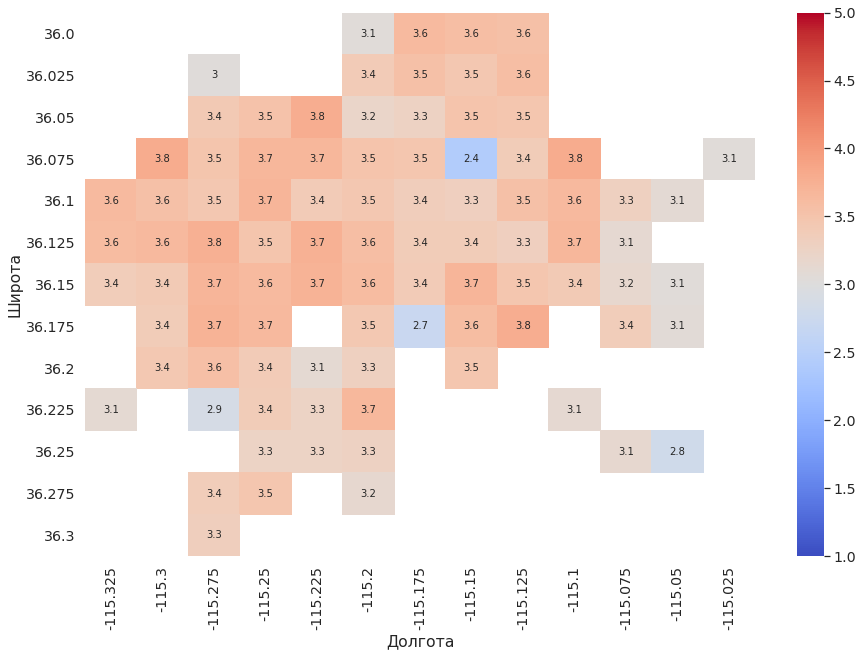

In [90]:
# разбиваем по районам
round_info_restaurants = dataset_restaurants.copy()
round_info_restaurants['longitude'] = round_info_restaurants['longitude'].apply(lambda x : np.round(x * 4, decimals=1)*0.25)
round_info_restaurants['latitude'] = round_info_restaurants['latitude'].apply(lambda x : np.round(x * 4, decimals=1)*0.25)
# round_info_restaurants
# отбираем только те районы, где есть хотя бы 10 ресторанов
restaurants_enough_info = round_info_restaurants.groupby(['latitude', 'longitude']).aggregate([np.mean, np.size])
restaurants_enough_info = restaurants_enough_info[restaurants_enough_info['average_rating']['size'] > 10]
restaurants_enough_info = restaurants_enough_info.reset_index()
restaurants_enough_info = restaurants_enough_info.droplevel(level = 0, axis = 1)
# переименовываем колонки
restaurants_enough_info.columns = ['latitude', 'longitude', 'average', 'count', 'mean', 'size']
# restaurants_enough_info
table_restaurants = restaurants_enough_info.pivot_table(index='latitude', columns='longitude', values='average')

plt.figure(figsize=(15,10))
sns.heatmap(table_restaurants,cmap='coolwarm', vmin=1, vmax = 5, annot=True)
plt.xlabel('Долгота')
plt.ylabel('Широта')
plt.show()

Чем полезны ограничения снизу на количество отзывов для ресторана и количество ресторанов в районе?

**Ответ:** Аналогично, этими ограничениями мы избавляемся от проблемы накрутки лайков и маленькой выборки соотвественно. Когда мало отзывов мы получаем необъективную оценку нескольких посетителей. Когда мало ресторанов в районе нам может казаться, что в районе достаточно хороших ресторанов, а там он может быть один, на весь район.

Кот Василий из города `N` очень придирчив к выбору ресторана. Он доверяет только ресторанам с высоким рейтингом, который основывается на большом количестве отзывов. Напечатайте в виде таблицы информацию $10$ ресторанах с самым большим рейтингом в порядке убывания рейтинга. Для каждого из этих ресторанов должно быть не менее $50$ отзывов. По каждому ресторану необходимо вывести следующую информации: название ресторана, средняя оценка, количество отзывов, географические координаты, категории.

In [91]:
best_restaurants = dataset_restaurants[dataset_restaurants['num_of_reviews'] >= 50].sort_values(
    by='average_rating', ascending=False)
best_restaurants = best_restaurants.drop(['business_id', 'city'], axis = 1)
best_restaurants.head(10)

,name,latitude,longitude,categories,average_rating,num_of_reviews
3599,"""Lip Smacking Foodie Tours""",36.114537,-115.172678,Food Tours;Restaurants;Event Planning & Servic...,4.966480,179
25397,"""Pepito Shack""",36.152477,-115.151945,Restaurants;Burgers;Food Stands;Sandwiches;Hot...,4.907692,65
16612,"""Bosa Boba Cafe""",36.125960,-115.184846,Vietnamese;Bubble Tea;Sandwiches;Food;Coffee &...,4.890909,55
25720,"""Garden Grill""",36.166783,-115.286197,Tacos;Street Vendors;Farmers Market;Vegetarian...,4.868132,91
2127,"""Brew Tea Bar""",36.054195,-115.242443,Cafes;Tea Rooms;Food;Bubble Tea;Restaurants;De...,4.848069,1165
18949,"""Poppa Naps BBQ""",36.116549,-115.088115,Food Stands;Hot Dogs;Caterers;Restaurants;Amer...,4.836538,104
12014,"""Zenaida's Cafe""",36.101741,-115.100359,Restaurants;Breakfast & Brunch;Cafes,4.833333,180
11918,"""El Frescos Cocina Mexicana""",36.098527,-115.148446,Caterers;Mexican;Restaurants;Food;Event Planni...,4.816754,191
5339,"""Blaqcat Ultra Hookah Lounge""",36.159742,-115.232738,Adult Entertainment;Lounges;Hookah Bars;Restau...,4.809524,63
25287,"""Smooth Eats""",36.167894,-115.140238,Juice Bars & Smoothies;Restaurants;Sandwiches;...,4.807018,57


Нанесите на карту все рестораны со средней оценкой не менее $4.7$, которая посчитана по не менее $50$ отзывам. Отдельным цветом отметьте 10 ресторанов, которые вы получили ранее.

In [94]:
best_of_the_best_restaurants = best_restaurants[best_restaurants['average_rating'] >= 4.7]
best_of_the_best_restaurants.loc[:, ('color')] = 'red'
best_of_the_best_restaurants.iloc[0:9, 6] = 'blue'
best_of_the_best_restaurants.head(10)

,name,latitude,longitude,categories,average_rating,num_of_reviews,color
3599,"""Lip Smacking Foodie Tours""",36.114537,-115.172678,Food Tours;Restaurants;Event Planning & Servic...,4.966480,179,blue
25397,"""Pepito Shack""",36.152477,-115.151945,Restaurants;Burgers;Food Stands;Sandwiches;Hot...,4.907692,65,blue
16612,"""Bosa Boba Cafe""",36.125960,-115.184846,Vietnamese;Bubble Tea;Sandwiches;Food;Coffee &...,4.890909,55,blue
25720,"""Garden Grill""",36.166783,-115.286197,Tacos;Street Vendors;Farmers Market;Vegetarian...,4.868132,91,blue
2127,"""Brew Tea Bar""",36.054195,-115.242443,Cafes;Tea Rooms;Food;Bubble Tea;Restaurants;De...,4.848069,1165,blue
18949,"""Poppa Naps BBQ""",36.116549,-115.088115,Food Stands;Hot Dogs;Caterers;Restaurants;Amer...,4.836538,104,blue
12014,"""Zenaida's Cafe""",36.101741,-115.100359,Restaurants;Breakfast & Brunch;Cafes,4.833333,180,blue
11918,"""El Frescos Cocina Mexicana""",36.098527,-115.148446,Caterers;Mexican;Restaurants;Food;Event Planni...,4.816754,191,blue
5339,"""Blaqcat Ultra Hookah Lounge""",36.159742,-115.232738,Adult Entertainment;Lounges;Hookah Bars;Restau...,4.809524,63,blue
25287,"""Smooth Eats""",36.167894,-115.140238,Juice Bars & Smoothies;Restaurants;Sandwiches;...,4.807018,57,red


In [93]:
fig = px.scatter_mapbox(
    best_of_the_best_restaurants, 
    lat='latitude',
    lon='longitude',
    hover_name = 'name',
    color='color',
    zoom=10)

fig.update_layout(mapbox_style = "open-street-map")
fig.show()

Охарактеризуйте кота Василия, а также сделайте общий вывод по задаче.

**Вывод:** На самом деле лекго заметить, что выборка получилась совсем небольшая. Всего ресторанов в списке $39$, а лучших из лучших $10$. 
Вообще, принципы кота Василия достаточно разумны, выбирая что-то в интернете, нужно смотреть на компании с большим числом отзывов, дабы избавиться от раскрученных мест и с хорошим рейтингом по понятным причинам.

В общем по задаче стоит сказать, что зависимость качества сервисов от географическомго местоположения не видна так четко, как, например, зависимость просмотров шоу от дня недели. Все районы имеют приблизительно равный средний рейтинг по компаниям. Однако с использованием карт гораздо лучше виден масштаб рассматриваемых данных, легче понять, в каких районах больше всего посетителей, какие может быть, благополучнее других.

Для совершения покупки или при планировании ужина лучше выбирать конкретную компанию и читать отзывы про нее, придерживаясь вышеизложенных принципов.